

---


# 1. >>> **PYTHON** <<<

### Downloading from online source and analyzing
Runtime: Python


---



## Setup, Download & Explore Files

### Setup

In [2]:
!pip install pyreadstat
!pip install pandas
!pip install requests
!pip install seaborn
!pip install scipy
!pip install matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 36.3 MB/s eta 0:00:00


In [3]:
import numpy as np
from scipy.stats import chi2_contingency, f_oneway
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pyreadstat
import os

### Downloads

In [4]:
import requests # DUplicte import just to make sure!!

folder = "/content/nhanes"
os.makedirs(folder, exist_ok=True)

nhanes_urls = {
    "demo": "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/DEMO_L.xpt",
    "bp": "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/BPXO_L.xpt",
    "itd": "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/VID_L.xpt",
    "hepb": "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/HEPB_S_L.xpt",
    "kidney": "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/KIQ_U_L.xpt",
    "minbehavior": "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/PAQ_L.xpt",
    "weight": "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/WHQ_L.xpt",
    "mental": "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/DPQ_L.xpt"
}

for url in nhanes_urls.values():
    filename = os.path.basename(url)
    filepath = os.path.join(folder, filename)
    print(f"Downloading {filename}...")
    response = requests.get(url)
    if response.status_code == 200:
        with open(filepath, "wb") as f:
            f.write(response.content)
        print(f"Saved to {filepath}")
    else:
        print(f"Failed to download {filename}: HTTP {response.status_code}")


Saved to /content/nhanes/DEMO_L.xpt
Saved to /content/nhanes/BPXO_L.xpt
Saved to /content/nhanes/VID_L.xpt
Saved to /content/nhanes/HEPB_S_L.xpt
Saved to /content/nhanes/KIQ_U_L.xpt
Saved to /content/nhanes/PAQ_L.xpt
Saved to /content/nhanes/WHQ_L.xpt
Saved to /content/nhanes/DPQ_L.xpt


### Explore XPT file

In [6]:
# READ_xport

df, meta = pyreadstat.read_xport('/content/nhanes/BPXO_L.xpt')
print("\n>>>1 Blood Pressure and Pulse data from the examination component\n")
print("Columns:", meta.column_names)
print("File label:", meta.file_label)
print(df.head())

df, meta = pyreadstat.read_xport('/content/nhanes/DPQ_L.xpt')
print("\n>>>2 Depression Screener Questionnaire data\n")
print("Columns:", meta.column_names)
print("File label:", meta.file_label)
print(df.head())

df, meta = pyreadstat.read_xport('/content/nhanes/HEPB_S_L.xpt')
print("\n>>>3 Hepatitis B Surface Antibody, Laboratory results\n")
print("Columns:", meta.column_names)
print("File label:", meta.file_label)
print(df.head())

df, meta = pyreadstat.read_xport('/content/nhanes/KIQ_U_L.xpt')
print("\n>>>4 Kidney Conditions Questionnaire data\n")
print("Columns:", meta.column_names)
print("File label:", meta.file_label)
print(df.head())

df, meta = pyreadstat.read_xport('/content/nhanes/PAQ_L.xpt')
print("\n>>>5 Physical Activity Questionnaire and Selected Activity Monitor data\n")
print("Columns:", meta.column_names)
print("File label:", meta.file_label)
print(df.head())

df, meta = pyreadstat.read_xport('/content/nhanes/VID_L.xpt')
print("\n>>>6 Vitamin D Laboratory data (serum vitamin D and related markers)\n")
print("Columns:", meta.column_names)
print("File label:", meta.file_label)
print(df.head())

df, meta = pyreadstat.read_xport('/content/nhanes/WHQ_L.xpt')
print("\n>>>7 Weight History Questionnaire (self-reported weight and weight changes)\n")
print("Columns:", meta.column_names)
print("File label:", meta.file_label)
print(df.head())

# READ_SAS

# read DEMO_L FILE with alt "read_sas" instead of "read_xport" as SAS XPORT was not read with read_xport

df = pd.read_sas('/content/nhanes/DEMO_L.xpt', format='xport', encoding='latin1')
    # or try encoding='utf-8' if latin1 fails
print("\n>>>8 Demographics data (includes age, sex, race, household, marital status, education, etc.)\n")
print("File read successfully!")
print("Columns:", meta.column_names)
print("File label:", meta.file_label)
print(df.head())


>>>1 Blood Pressure and Pulse data from the examination component

Columns: ['SEQN', 'BPAOARM', 'BPAOCSZ', 'BPXOSY1', 'BPXODI1', 'BPXOSY2', 'BPXODI2', 'BPXOSY3', 'BPXODI3', 'BPXOPLS1', 'BPXOPLS2', 'BPXOPLS3']
File label: None
       SEQN BPAOARM  BPAOCSZ  BPXOSY1  BPXODI1  BPXOSY2  BPXODI2  BPXOSY3  \
0  130378.0       R      4.0    135.0     98.0    131.0     96.0    132.0   
1  130379.0       R      4.0    121.0     84.0    117.0     76.0    113.0   
2  130380.0       R      4.0    111.0     79.0    112.0     80.0    104.0   
3  130386.0       R      4.0    110.0     72.0    120.0     74.0    115.0   
4  130387.0       R      4.0    143.0     76.0    136.0     74.0    145.0   

   BPXODI3  BPXOPLS1  BPXOPLS2  BPXOPLS3  
0     94.0      82.0      79.0      82.0  
1     76.0      72.0      71.0      73.0  
2     76.0      84.0      83.0      77.0  
3     75.0      59.0      64.0      64.0  
4     78.0      80.0      80.0      77.0  

>>>2 Depression Screener Questionnaire data

Column

### CONVERT XPT TO CSV

### Convert in Python

In [7]:
# Convert XPT to CSV in Python (not R)

def batch_convert_xpt_to_csv(xpt_folder, csv_folder):
    if not os.path.exists(csv_folder):
        os.makedirs(csv_folder)
    for filename in os.listdir(xpt_folder):
        if filename.lower().endswith(".xpt"):
            xpt_path = os.path.join(xpt_folder, filename)
            csv_path = os.path.join(csv_folder, filename.replace(".xpt", ".csv"))
            df = pd.read_sas(xpt_path, format='xport')
            df.to_csv(csv_path, index=False)
            print(f"Converted {filename} to CSV.")

# Set folder paths
xpt_folder = "/content/nhanes"
csv_folder = "/content/nhanes_csv"

# Run batch conversion
batch_convert_xpt_to_csv(xpt_folder, csv_folder)


Converted BPXO_L.xpt to CSV.
Converted DEMO_L.xpt to CSV.
Converted HEPB_S_L.xpt to CSV.
Converted VID_L.xpt to CSV.
Converted DPQ_L.xpt to CSV.
Converted WHQ_L.xpt to CSV.
Converted KIQ_U_L.xpt to CSV.
Converted PAQ_L.xpt to CSV.


### Convert using R (Alternative)

### Change Runtime to R

In [ ]:
install.packages("haven")


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
# Converting all .xpt files to .csv
# Load the library
library(haven)

# Set folder path
folder <- "/content/nhanes"

# List all .xpt files
xpt_files <- list.files(folder, pattern = "\\.xpt$", full.names = TRUE)

# Loop through and convert each to .csv
for (xpt_file in xpt_files) {
  # Read .xpt file
  data <- read_xpt(xpt_file)

  # Create .csv filename
  csv_file <- sub("\\.xpt$", ".csv", xpt_file)

  # Write to CSV
  write.csv(data, csv_file, row.names = FALSE)

  cat("✅ Converted:", xpt_file, "→", csv_file, "\n")
}

#### Change runtime back to Python

## Explore CSV files

### Duplicate installs

In [8]:
!pip install pyreadstat
!pip install pandas
!pip install requests
!pip install seaborn
!pip install scipy
!pip install matplotlib

In [ ]:
import pandas as pd

In [ ]:
import numpy as np
from scipy.stats import chi2_contingency, f_oneway
import matplotlib.pyplot as plt
import seaborn as sns
import pyreadstat
import os

### Read CSV's and validate

In [9]:
bp = pd.read_csv("/content/nhanes_csv/BPXO_L.csv")
print(">>>1 Bloodpressure")
print("Columns:", bp.columns.tolist())
print(bp.head())

vitd = pd.read_csv("/content/nhanes_csv/VID_L.csv")
print(">>>2 Vitamin D")
print("Columns:", vitd.columns.tolist())
print(vitd.head())

hepb = pd.read_csv("/content/nhanes_csv/HEPB_S_L.csv")
print(">>>3 Hepatitis B")
print("Columns:", hepb.columns.tolist())
print(hepb.head())

kidney = pd.read_csv("/content/nhanes_csv/KIQ_U_L.csv")
print(">>>4 Kidney")
print("Columns:", kidney.columns.tolist())
print(kidney.head())

minbehavior = pd.read_csv("/content/nhanes_csv/PAQ_L.csv")
print(">>>5 Physical Activity")
print("Columns:", minbehavior.columns.tolist())
print(minbehavior.head())

weight = pd.read_csv("/content/nhanes_csv/WHQ_L.csv")
print(">>>6 Weight History")
print("Columns:", weight.columns.tolist())
print(weight.head())

mental = pd.read_csv("/content/nhanes_csv/DPQ_L.csv")
print(">>>7 Depression Screener")
print("Columns:", mental.columns.tolist())
print(mental.head())

demo = pd.read_csv("/content/nhanes_csv/DEMO_L.csv")
print(">>>8 Demographics")
print("Columns:", demo.columns.tolist())
print(demo.head())

>>>1 Bloodpressure
Columns: ['SEQN', 'BPAOARM', 'BPAOCSZ', 'BPXOSY1', 'BPXODI1', 'BPXOSY2', 'BPXODI2', 'BPXOSY3', 'BPXODI3', 'BPXOPLS1', 'BPXOPLS2', 'BPXOPLS3']
       SEQN BPAOARM  BPAOCSZ  BPXOSY1  BPXODI1  BPXOSY2  BPXODI2  BPXOSY3  \
0  130378.0    b'R'      4.0    135.0     98.0    131.0     96.0    132.0   
1  130379.0    b'R'      4.0    121.0     84.0    117.0     76.0    113.0   
2  130380.0    b'R'      4.0    111.0     79.0    112.0     80.0    104.0   
3  130386.0    b'R'      4.0    110.0     72.0    120.0     74.0    115.0   
4  130387.0    b'R'      4.0    143.0     76.0    136.0     74.0    145.0   

   BPXODI3  BPXOPLS1  BPXOPLS2  BPXOPLS3  
0     94.0      82.0      79.0      82.0  
1     76.0      72.0      71.0      73.0  
2     76.0      84.0      83.0      77.0  
3     75.0      59.0      64.0      64.0  
4     78.0      80.0      80.0      77.0  
>>>2 Vitamin D
Columns: ['SEQN', 'WTPH2YR', 'LBXVIDMS', 'LBDVIDLC', 'LBXVD2MS', 'LBDVD2LC', 'LBXVD3MS', 'LBDVD3LC', 'L

### Renaming columns and saving as renamed CSVs

### Demographics

In [10]:
# Load CSV file
demodf = pd.read_csv("/content/nhanes_csv/DEMO_L.csv")

# Create a mapping dictionary based on CDC documentation
column_map = {
    'SEQN': 'Respondent Sequence Number',
    'SDDSRVYR': 'NHANES Survey Cycle',
    'RIDSTATR': 'Interview/Examination Status',
    'RIAGENDR': 'Gender',
    'RIDAGEYR': 'Age at Screening Adjudicated - Years',
    'RIDAGEMN': 'Age in Months at Screening - 0 to 24 mos',
    'RIDRETH1': 'Hispanic Origin w/ Race - Recode',
    'RIDRETH3': 'Race/Hispanic Origin w/ NH-Asian',
    'RIDEXMON': 'Six Month Time Period',
    'RIDEXAGM': 'Age in Months at Screening - Top Coded',
    'DMQMILIZ': 'Served Active Duty in U.S. Armed Forces',
    'DMDBORN4': 'Country of Birth',
    'DMDYRUSR': 'Length of Time in U.S.',
    'DMDEDUC2': 'Education Level - Adults 20+',
    'DMDMARTZ': 'Marital Status',
    'RIDEXPRG': 'Pregnancy Status at Exam',
    'DMDHHSIZ': 'Total Number of People in Household',
    'DMDHRGND': 'Total Number of Males in Household',
    'DMDHRAGZ': 'Total Number of Males Ages 15+ in HH',
    'DMDHREDZ': 'Total Number of Females in Household',
    'DMDHRMAZ': 'Total Number of Persons <5 Years Old',
    'DMDHSEDZ': 'Total Number of Persons 5-17 Years Old',
    'WTINT2YR': 'Full Sample 2 Year Interview Weight',
    'WTMEC2YR': 'Full Sample 2 Year MEC Exam Weight',
    'SDMVSTRA': 'Masked Variance Pseudo-PSU',
    'SDMVPSU': 'Masked Variance Pseudo-Stratum',
    'INDFMPIR': 'Ratio of Family Income to Poverty'
}

# Rename columns
demodf_renamed = demodf.rename(columns=column_map)

# Save to a new CSV
demodf_renamed.to_csv('/content/nhanes_csv/DEMOrenamed.csv', index=False)

# Preview the renamed DataFrame
print(demodf_renamed.head())


   Respondent Sequence Number  NHANES Survey Cycle  \
0                    130378.0                 12.0   
1                    130379.0                 12.0   
2                    130380.0                 12.0   
3                    130381.0                 12.0   
4                    130382.0                 12.0   

   Interview/Examination Status  Gender  Age at Screening Adjudicated - Years  \
0                           2.0     1.0                                  43.0   
1                           2.0     1.0                                  66.0   
2                           2.0     2.0                                  44.0   
3                           2.0     2.0                                   5.0   
4                           2.0     1.0                                   2.0   

   Age in Months at Screening - 0 to 24 mos  Hispanic Origin w/ Race - Recode  \
0                                       NaN                               5.0   
1                         

### Blood Pressure

In [11]:
# Load CSV file
bpdf = pd.read_csv('/content/nhanes_csv/BPXO_L.csv')

# Create a mapping dictionary based on CDC documentation
rename_dict = {
    'SEQN': 'Respondent Sequence Number',
    'BPAOARM': 'Arm',
    'BPAOCSZ': 'CuffSize',
    'BPXOSY1': 'Sys1',
    'BPXODI1': 'Dia1',
    'BPXOSY2': 'Sys2',
    'BPXODI2': 'Dia2',
    'BPXOSY3': 'Sys3',
    'BPXODI3': 'Dia3',
    'BPXOPLS1': 'Pulse1',
    'BPXOPLS2': 'Pulse2',
    'BPXOPLS3': 'Pulse3'
}

# Rename columns
bpdf_renamed = bpdf.rename(columns=rename_dict)

# Save to a new CSV
bpdf_renamed.to_csv('/content/nhanes_csv/BPrenamed.csv', index=False)

# Preview the renamed DataFrame
print(bpdf_renamed.head())


   Respondent Sequence Number   Arm  CuffSize   Sys1  Dia1   Sys2  Dia2  \
0                    130378.0  b'R'       4.0  135.0  98.0  131.0  96.0   
1                    130379.0  b'R'       4.0  121.0  84.0  117.0  76.0   
2                    130380.0  b'R'       4.0  111.0  79.0  112.0  80.0   
3                    130386.0  b'R'       4.0  110.0  72.0  120.0  74.0   
4                    130387.0  b'R'       4.0  143.0  76.0  136.0  74.0   

    Sys3  Dia3  Pulse1  Pulse2  Pulse3  
0  132.0  94.0    82.0    79.0    82.0  
1  113.0  76.0    72.0    71.0    73.0  
2  104.0  76.0    84.0    83.0    77.0  
3  115.0  75.0    59.0    64.0    64.0  
4  145.0  78.0    80.0    80.0    77.0  


### Vit D

In [12]:
# Load CSV
vitdf = pd.read_csv('/content/nhanes_csv/VID_L.csv')

# Create a mapping dictionary based on CDC documentation
col_map = {
    'SEQN': 'Respondent Sequence Number',
    'WTPH2YR': 'Sample Weight: two year MEC',
    'LBXVIDMS': 'Vitamin D (ng/mL)',
    'LBDVIDLC': 'Vitamin D Comment Code',
    'LBXVD2MS': '25-Hydroxyvitamin D2',
    'LBDVD2LC': '25(OH)D2 Comment Code',
    'LBXVD3MS': '25-Hydroxyvitamin D3',
    'LBDVD3LC': '25(OH)D3 Comment Code',
    'LBXVE3MS': '3-Epi-25-Hydroxyvitamin D3',
    'LBDVE3LC': '3-Epi-25(OH)D3 Comment Code'
}

# Rename columns
vitdf.rename(columns=col_map, inplace=True)

# Save to new CSV
vitdf.to_csv('/content/nhanes_csv/VIDrenamed.csv', index=False)

# Preview the renamed DataFrame
print(vitdf.head())


   Respondent Sequence Number  Sample Weight: two year MEC  Vitamin D (ng/mL)  \
0                    130378.0                 5.604213e+04               58.9   
1                    130379.0                 3.743571e+04               60.5   
2                    130380.0                 8.532884e+04               39.4   
3                    130381.0                 5.397605e-79                NaN   
4                    130382.0                 5.963893e+04                NaN   

   Vitamin D Comment Code  25-Hydroxyvitamin D2  25(OH)D2 Comment Code  \
0            5.397605e-79                  1.57                    1.0   
1            5.397605e-79                  1.57                    1.0   
2            5.397605e-79                  1.57                    1.0   
3                     NaN                   NaN                    NaN   
4                     NaN                   NaN                    NaN   

   25-Hydroxyvitamin D3  25(OH)D3 Comment Code  3-Epi-25-Hydroxyvita

### Hep B

In [13]:
# Load CSV
hepbdf = pd.read_csv('/content/nhanes_csv/HEPB_S_L.csv')

# Alt approach to renaming files than used above

# Create a mapping dictionary based on CDC documentation and rename columns
hepbdf.rename(columns={
    'SEQN': 'Respondent Sequence Number',
    'WTPH2YR': 'Full Sample 2 Year MEC Exam Weight',
    'LBXHBS': 'Hepatitis B Surface Antibody (anti-HBs) (mIU/mL)'
}, inplace=True)

# Save the renamed DataFrame to a new CSV file
hepbdf.to_csv('/content/nhanes_csv/HEPBrenamed.csv', index=False)

# Preview the renamed DataFrame
print(hepbdf.head())


   Respondent Sequence Number  Full Sample 2 Year MEC Exam Weight  \
0                    130378.0                        5.604213e+04   
1                    130379.0                        3.743571e+04   
2                    130380.0                        8.532884e+04   
3                    130381.0                        5.397605e-79   
4                    130382.0                        5.963893e+04   

   Hepatitis B Surface Antibody (anti-HBs) (mIU/mL)  
0                                               2.0  
1                                               2.0  
2                                               2.0  
3                                               NaN  
4                                               2.0  


### Kidney

In [14]:
# Load CSV
kidneydf = pd.read_csv('/content/nhanes_csv/KIQ_U_L.csv')

# Alt approach to renaming files than used above

# Create a mapping dictionary based on CDC documentation and rename columns
kidneydf.rename(columns={
    'SEQN': 'Respondent Sequence Number',
    'KIQ022': 'Ever told had weak/failing kidneys',
    'KIQ025': 'Doctor said weak/failing kidneys lasted 3 months or longer',
    'KIQ005': 'Ever told had kidney stones',
    'KIQ010': 'Passed a kidney stone',
    'KIQ042': 'Ever told had kidney infection',
    'KIQ044': 'Seen doctor for kidney infection',
    'KIQ052': 'Ever had bladder infection',
    'KIQ481': 'Blood in urine during infection'
}, inplace=True)

# Save the renamed DataFrame to a new CSV file
kidneydf.to_csv('/content/nhanes_csv/KIQrenamed.csv', index=False)

# Preview the renamed DataFrame
print(kidneydf.head())

   Respondent Sequence Number  Ever told had weak/failing kidneys  \
0                    130378.0                                 2.0   
1                    130379.0                                 2.0   
2                    130380.0                                 2.0   
3                    130384.0                                 2.0   
4                    130385.0                                 2.0   

   Doctor said weak/failing kidneys lasted 3 months or longer  \
0                                                NaN            
1                                                NaN            
2                                                NaN            
3                                                NaN            
4                                                NaN            

   Ever told had kidney stones  Passed a kidney stone  \
0                          NaN                    NaN   
1                          2.0                    2.0   
2                      

### Physical activity

In [15]:
# Load your CSV
padf = pd.read_csv("/content/nhanes_csv/PAQ_L.csv")

# Create a mapping dictionary based on CDC documentation
column_rename = {
    "SEQN": "Respondent Sequence Number",
    "PAD790Q": "Minutes Walk/Bike Typical Day",
    "PAD790U": "Walk/Bike Day Unit",
    "PAD800": "Walk/Bike Minutes Per Day",
    "PAD810Q": "Minutes Vigorous-Intensity Activity",
    "PAD810U": "Vigorous Activity Unit",
    "PAD820": "Vigorous-Intensity Minutes Per Day",
    "PAD680": "Sedentary Behavior Time (minutes)"
}

# Rename columns
padf.rename(columns=column_rename, inplace=True)

# Save to new CSV
padf.to_csv("/content/nhanes_csv/PAQrenamed.csv", index=False)

# Preview the renamed DataFrame
print(padf.head())


   Respondent Sequence Number  Minutes Walk/Bike Typical Day  \
0                    130378.0                   3.000000e+00   
1                    130379.0                   4.000000e+00   
2                    130380.0                   1.000000e+00   
3                    130384.0                   5.397605e-79   
4                    130385.0                   1.000000e+00   

  Walk/Bike Day Unit  Walk/Bike Minutes Per Day  \
0               b'W'                       45.0   
1               b'W'                       45.0   
2               b'W'                       20.0   
3                b''                        NaN   
4               b'D'                       90.0   

   Minutes Vigorous-Intensity Activity Vigorous Activity Unit  \
0                         3.000000e+00                   b'W'   
1                         3.000000e+00                   b'W'   
2                         5.397605e-79                    b''   
3                         5.397605e-79          

### Weight History

In [16]:
# Load CSV file
whdf = pd.read_csv('/content/nhanes_csv/WHQ_L.csv')

# Create a mapping dictionary based on CDC documentation
column_map = {
    'SEQN': 'Respondent Sequence Number',
    'WHD010': 'Weight1YearAgoKg',
    'WHD020': 'CurrentWeightKg',
    'WHD050': 'MaxWeightKg',
    'WHQ070': 'OverweightToldByDoctor'
}

# Rename columns
whdf.rename(columns=column_map, inplace=True)

# Save to new CSV
whdf.to_csv('/content/nhanes_csv/WHQrenamed.csv', index=False)

# Preview the renamed DataFrame
print(whdf.head())


   Respondent Sequence Number  Weight1YearAgoKg  CurrentWeightKg  MaxWeightKg  \
0                    130378.0              71.0            190.0        200.0   
1                    130379.0              70.0            220.0        220.0   
2                    130380.0              60.0            150.0        165.0   
3                    130384.0              68.0            204.0        212.0   
4                    130385.0              70.0            240.0        240.0   

   OverweightToldByDoctor  
0                     1.0  
1                     2.0  
2                     1.0  
3                     1.0  
4                     2.0  


### Mental Health - Depression Screener


In [17]:
# Load CSV file
mhdf = pd.read_csv('/content/nhanes_csv/DPQ_L.csv')

# Create a mapping dictionary based on CDC documentation
col_map = {
    'SEQN':  'Respondent Sequence Number',
    'DPQ010': 'Little interest or pleasure in doing things',
    'DPQ020': 'Feeling down, depressed, or hopeless',
    'DPQ030': 'Trouble sleeping',
    'DPQ040': 'Feeling tired or little energy',
    'DPQ050': 'Poor appetite or overeating',
    'DPQ060': 'Feeling bad about yourself',
    'DPQ070': 'Trouble concentrating',
    'DPQ080': 'Moving or speaking slowly/fast',
    'DPQ090': 'Thoughts of self-harm',
    'DPQ100': 'Difficulty with daily activities',
}

# Rename columns
mhdf.rename(columns=col_map, inplace=True)

# Save to new CSV
mhdf.to_csv('/content/nhanes_csv/DPQrenamed.csv', index=False)

# Preview the renamed DataFrame
print(mhdf.head())

   Respondent Sequence Number  Little interest or pleasure in doing things  \
0                    130378.0                                          NaN   
1                    130379.0                                 5.397605e-79   
2                    130380.0                                 5.397605e-79   
3                    130386.0                                 5.397605e-79   
4                    130387.0                                 5.397605e-79   

   Feeling down, depressed, or hopeless  Trouble sleeping  \
0                                   NaN               NaN   
1                          5.397605e-79      1.000000e+00   
2                          5.397605e-79      1.000000e+00   
3                          5.397605e-79      5.397605e-79   
4                          5.397605e-79      5.397605e-79   

   Feeling tired or little energy  Poor appetite or overeating  \
0                             NaN                          NaN   
1                    5.397605e-7

## Explore renamed CSV files

In [18]:
demo = pd.read_csv("/content/nhanes_csv/DEMOrenamed.csv")
print("\n>>>0 Demographics\n")
print("Columns:", demo.columns.tolist())
print(demo.head())

bp = pd.read_csv("/content/nhanes_csv/BPrenamed.csv")
print("\n>>>1 Bloodpressure\n")
print("Columns:", bp.columns.tolist())
print(bp.head())

vitd = pd.read_csv("/content/nhanes_csv/VIDrenamed.csv")
print("\n>>>2 Vitamin D\n")
print("Columns:", vitd.columns.tolist())
print(vitd.head())

hepb = pd.read_csv("/content/nhanes_csv/HEPBrenamed.csv")
print("\n>>>3 Hepatitis B\n")
print("Columns:", hepb.columns.tolist())
print(hepb.head())

kidney = pd.read_csv("/content/nhanes_csv/KIQrenamed.csv")
print("\n>>>4 Kidney\n")
print("Columns:", kidney.columns.tolist())
print(kidney.head())

minbehavior = pd.read_csv("/content/nhanes_csv/PAQrenamed.csv")
print("\n>>>5 Physical Activity\n")
print("Columns:", minbehavior.columns.tolist())
print(minbehavior.head())

weight = pd.read_csv("/content/nhanes_csv/WHQrenamed.csv")
print("\n>>>6 Weight History\n")
print("Columns:", weight.columns.tolist())
print(weight.head())

mental = pd.read_csv("/content/nhanes_csv/DPQrenamed.csv")
print("\n>>>7 Depression Screener\n")
print("Columns:", mental.columns.tolist())
print(mental.head())



>>>0 Demographics

Columns: ['Respondent Sequence Number', 'NHANES Survey Cycle', 'Interview/Examination Status', 'Gender', 'Age at Screening Adjudicated - Years', 'Age in Months at Screening - 0 to 24 mos', 'Hispanic Origin w/ Race - Recode', 'Race/Hispanic Origin w/ NH-Asian', 'Six Month Time Period', 'Age in Months at Screening - Top Coded', 'Served Active Duty in U.S. Armed Forces', 'Country of Birth', 'Length of Time in U.S.', 'Education Level - Adults 20+', 'Marital Status', 'Pregnancy Status at Exam', 'Total Number of People in Household', 'Total Number of Males in Household', 'Total Number of Males Ages 15+ in HH', 'Total Number of Females in Household', 'Total Number of Persons <5 Years Old', 'Total Number of Persons 5-17 Years Old', 'Full Sample 2 Year Interview Weight', 'Full Sample 2 Year MEC Exam Weight', 'Masked Variance Pseudo-PSU', 'Masked Variance Pseudo-Stratum', 'Ratio of Family Income to Poverty']
   Respondent Sequence Number  NHANES Survey Cycle  \
0             

## Analysis 1:

### Chi-square test between marital status and education level

### Cleaned subset of data after filtering

In [19]:
# Step 1: Select and clean relevant columns

Analysis1 = (
    demo[['Marital Status', 'Education Level - Adults 20+']]
    .query("`Marital Status`.notna() and `Education Level - Adults 20+`.notna()")
    .query("`Marital Status` not in [77, 99] and `Education Level - Adults 20+` not in [7, 9]")
)

print("Step 1 - Selected and cleaned data:")
print(f"Data shape: {Analysis1.shape}\n")
print(Analysis1.head())


Step 1 - Selected and cleaned data:
Data shape: (7772, 2)

   Marital Status  Education Level - Adults 20+
0             1.0                           5.0
1             1.0                           5.0
2             1.0                           3.0
6             3.0                           2.0
7             1.0                           3.0


### Recoded and filtered categorical columns

In [20]:
# Step 2: Recode categories using new column names
marital_map = {
    1: 'Married',
    2: 'Widowed/Divorced/Separated',
    3: 'Single'
}

Analysis1['MaritalStatus'] = Analysis1['Marital Status'].map(marital_map)

Analysis1['EducLevel'] = Analysis1['Education Level - Adults 20+'].apply(
    lambda x: 'Bachelor or Higher' if x == 5 else 'Less than Bachelor'
)

print("Step 2 - Recoded categories:")
print(Analysis1[['MaritalStatus', 'EducLevel']].head())
print(f"Data shape after recoding: {Analysis1.shape}\n")

# Step 3: Drop rows with missing values in recoded categories
filtered = Analysis1[['MaritalStatus', 'EducLevel']].dropna()

print("Step 3 - Data after dropping missing recodes:")
print(filtered.head())
print(f"Data shape after dropping: {filtered.shape}\n")



Step 2 - Recoded categories:
  MaritalStatus           EducLevel
0       Married  Bachelor or Higher
1       Married  Bachelor or Higher
2       Married  Less than Bachelor
6        Single  Less than Bachelor
7       Married  Less than Bachelor
Data shape after recoding: (7772, 4)

Step 3 - Data after dropping missing recodes:
  MaritalStatus           EducLevel
0       Married  Bachelor or Higher
1       Married  Bachelor or Higher
2       Married  Less than Bachelor
6        Single  Less than Bachelor
7       Married  Less than Bachelor
Data shape after dropping: (7772, 2)



### Contingency table of cross-tabulated categories

to explore relationships between categorical variables

In [21]:
# Create contingency table using updated column names
contingency_table = pd.crosstab(filtered['MaritalStatus'], filtered['EducLevel'])

print("Step 4 - Contingency Table:")
print(contingency_table)


Step 4 - Contingency Table:
EducLevel                   Bachelor or Higher  Less than Bachelor
MaritalStatus                                                     
Married                                   1631                2503
Single                                     517                1106
Widowed/Divorced/Separated                 473                1542


### Chi-square test statistics and interpretation

In [22]:
# Step 5: Output results

from scipy.stats import chi2_contingency

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"\nChi-square Statistic: {chi2:.2f}")
print(f"Degrees of Freedom: {dof}")
print(f"P-value: {p:.4f}\n")


Chi-square Statistic: 157.97
Degrees of Freedom: 2
P-value: 0.0000



In [23]:
# Interpretation
if p < 0.05:
    print("\n✅ Statistically significant association between marital status and education level.")
else:
    print("\n❌ No statistically significant association found.")


✅ Statistically significant association between marital status and education level.


### VISUALIZATION

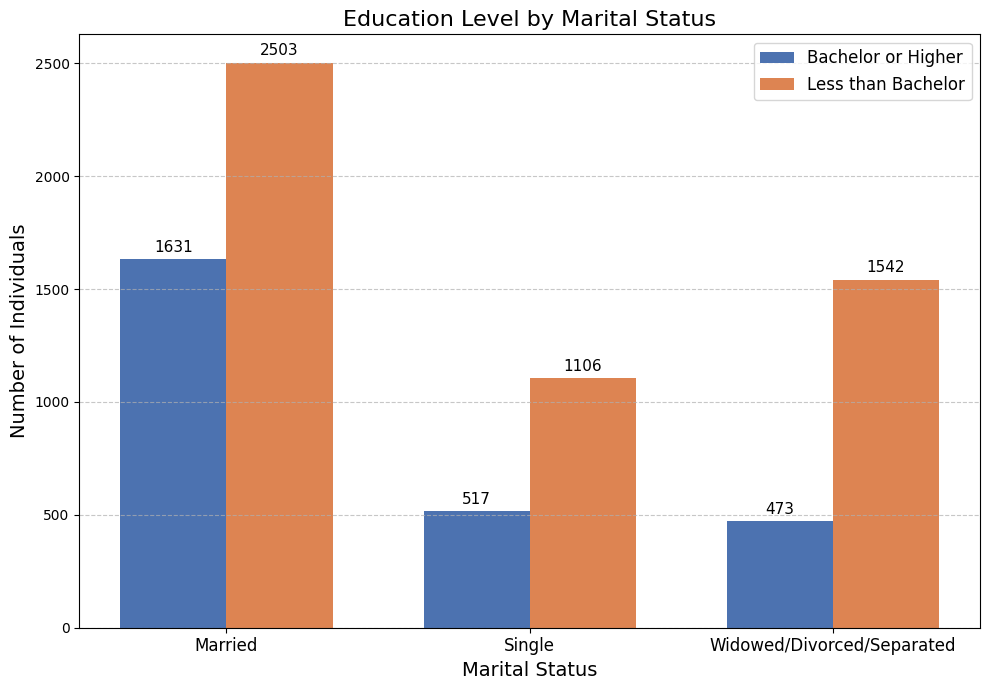

In [24]:
# Step 6

import numpy as np
import matplotlib.pyplot as plt

# Data from contingency table
categories = contingency_table.index.tolist()
bachelor_counts = contingency_table['Bachelor or Higher'].tolist()
less_bachelor_counts = contingency_table['Less than Bachelor'].tolist()

x = np.arange(len(categories))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 7))

bars1 = ax.bar(x - width/2, bachelor_counts, width, label='Bachelor or Higher', color='#4c72b0')
bars2 = ax.bar(x + width/2, less_bachelor_counts, width, label='Less than Bachelor', color='#dd8452')

ax.set_xlabel('Marital Status', fontsize=14)
ax.set_ylabel('Number of Individuals', fontsize=14)
ax.set_title('Education Level by Marital Status', fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(categories, fontsize=12)
ax.legend(fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add data labels on bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # Offset label above bar
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=11)

add_labels(bars1)
add_labels(bars2)

plt.tight_layout()
plt.show()


### Interpretation
1: Is there an association between marital status (married or not married) and education level (bachelor’s degree or higher vs. less than a bachelor’s degree)?

As the **Chi-square test** evaluates whether there is a significant association between categorical variables marital status and education level, the 2 variables for this test, the large Chi-square statistic of 157.97 indicates a **substantial difference** between the observed frequencies and the expected frequencies assuming no association.

The **p-value** of 0.0000 - also checked by changing from 4 decimal point to 3 decimal points - means the probability of observing these differences by random chance if there were no true association i.e. random chance, is virtually zero. Since p < 0.05, the null hypothesis that marital status and education level are independent is rejected.

1: The test provides strong evidence that
- there is a statistically significant association between marital status and education level in the sample dataset; meaning that
- marital status and education level are **dependent categories**, not independent

The distribution of *education levels* **differs meaningfully** across *marital status* groups.

Looking at the visualization below; the distribution between unmarried single and unmarried (widowded, etc) is comparable

## Analysis 2:

### One-Way ANOVA
### (Analysis of Variance) between marital status and sedientary behavior time

### Select, Merge, Map, Display

In [25]:
import pandas as pd

# Load input files (adjust paths if needed)
demo = pd.read_csv('/content/nhanes_csv/DEMOrenamed.csv')
minbehavior = pd.read_csv('/content/nhanes_csv/PAQrenamed.csv')

# Marital status mapping dictionary
marital_map = {
    1: 'Married',
    2: 'Widowed/Divorced/Separated',
    3: 'Single'
}

# Step 1: Select and merge relevant columns
Analysis2 = pd.merge(
    demo[['Respondent Sequence Number', 'Marital Status']],
    minbehavior[['Respondent Sequence Number', 'Sedentary Behavior Time (minutes)']],
    on='Respondent Sequence Number',
    how='inner'
)

# Map numeric marital status to descriptive labels
Analysis2['Marital Status'] = Analysis2['Marital Status'].map(marital_map)

print("Step 1 - Merged data preview with mapped Marital Status:")
print(Analysis2.head())
print(f"Data shape: {Analysis2.shape}\n")


Step 1 - Merged data preview with mapped Marital Status:
   Respondent Sequence Number Marital Status  \
0                    130378.0        Married   
1                    130379.0        Married   
2                    130380.0        Married   
3                    130384.0         Single   
4                    130385.0        Married   

   Sedentary Behavior Time (minutes)  
0                              360.0  
1                              480.0  
2                              240.0  
3                               60.0  
4                              180.0  
Data shape: (8153, 3)



### Filter & Clean

In [26]:
# Step 2: Filter & Clean data based on renamed columns

filtered = (
    Analysis2[['Marital Status', 'Sedentary Behavior Time (minutes)']]
    .query("`Marital Status`.notna() and `Sedentary Behavior Time (minutes)`.notna()")
    .query("`Marital Status` not in ['Unknown', 'Refused'] and `Sedentary Behavior Time (minutes)` not in [7777, 9999]")
)

print("Step 2 - Filtered cleaned data preview:")
print(filtered.head())
print(f"Data shape after filtering: {filtered.shape}\n")


Step 2 - Filtered cleaned data preview:
  Marital Status  Sedentary Behavior Time (minutes)
0        Married                              360.0
1        Married                              480.0
2        Married                              240.0
3         Single                               60.0
4        Married                              180.0
Data shape after filtering: (7709, 2)



### Groups for Anova

In [27]:
# Step 3: Create groups for ANOVA
groups = {
    status: filtered.loc[filtered['Marital Status'] == status, 'Sedentary Behavior Time (minutes)']
    for status in marital_map.values()
}

# Display group sizes and means
for status, group in groups.items():
    print(f"Group '{status}' size: {len(group)},\n Mean 'Sedentary Behavior Time (minutes)': {group.mean():.2f}\n")

Group 'Married' size: 4106,
 Mean 'Sedentary Behavior Time (minutes)': 353.29

Group 'Widowed/Divorced/Separated' size: 1989,
 Mean 'Sedentary Behavior Time (minutes)': 363.46

Group 'Single' size: 1614,
 Mean 'Sedentary Behavior Time (minutes)': 382.43



### 1-Way Anova

In [28]:
# Step 5: Run one-way ANOVA

from scipy.stats import f_oneway

f_stat, p_value = f_oneway(*groups.values())
print(f"\nANOVA Results:\nF-statistic = {f_stat:.2f}\nP-value = {p_value:.3f}\n")


ANOVA Results:
F-statistic = 11.09
P-value = 0.000



### Interpretation of 1 way Anova

In [29]:
# Interpretation

if p_value < 0.05:
    print("✅ Statistically significant difference in mean sedentary behavior time across marital status groups.\n")
else:
    print("❌ No statistically significant difference found.\n")

✅ Statistically significant difference in mean sedentary behavior time across marital status groups.



### VISUALIZATION

#### Boxplot with annotated means and ANOVA stats

The box plot shows the distribution of mean sedentary behavior time (in minutes) by marital status groups: Married, Widowed/Divorced/Separated, and Single.

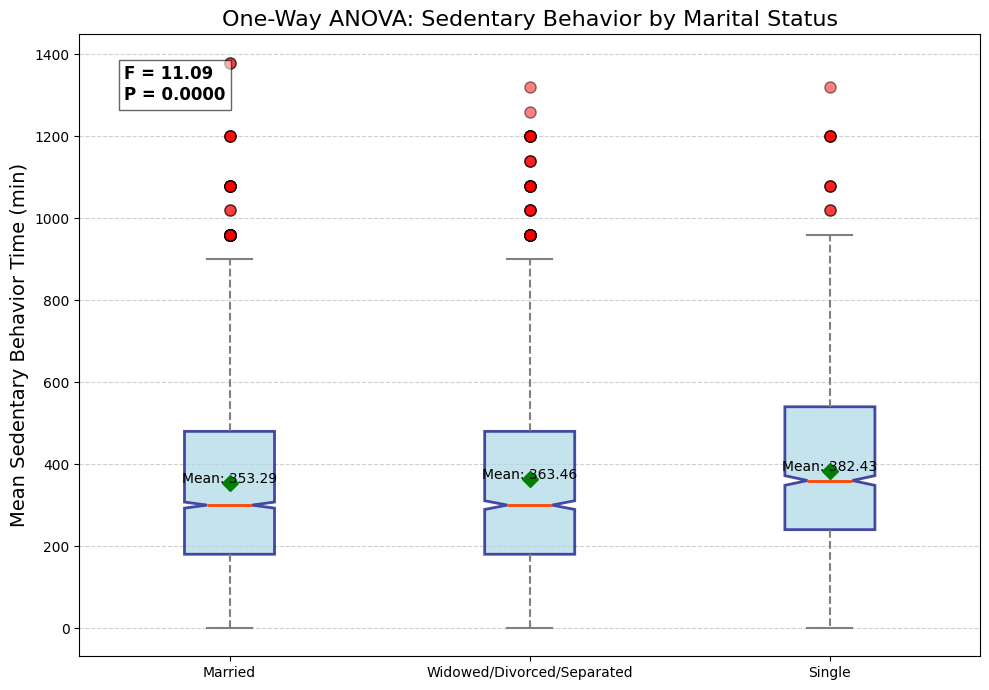

In [30]:
# Data and labels
data = [group.values for group in groups.values()]
labels = list(groups.keys())

fig, ax = plt.subplots(figsize=(10, 7))

# Define box plot style dicts
boxprops = dict(facecolor='lightblue', color='navy', linewidth=2, alpha=0.7)
medianprops = dict(color='orangered', linewidth=2)
whiskerprops = dict(color='gray', linewidth=1.5, linestyle='--')
capprops = dict(color='gray', linewidth=1.5)
flierprops = dict(marker='o', markerfacecolor='red', markersize=8, alpha=0.5)

# Create boxplot with notch and custom styles using tick_labels instead of labels
box = ax.boxplot(data, tick_labels=labels, patch_artist=True, notch=True,
                 boxprops=boxprops, medianprops=medianprops,
                 whiskerprops=whiskerprops, capprops=capprops, flierprops=flierprops)

# Add mean points and annotations
for i, group in enumerate(groups.values(), start=1):
    mean_val = group.mean()
    ax.plot(i, mean_val, marker='D', color='green', markersize=8)
    ax.text(i, mean_val + 0.5, f'Mean: {mean_val:.2f}', ha='center', color='black', fontsize=10)

# Annotate ANOVA results on top
max_y = max(np.concatenate(data))
ax.text(0.05, 0.95, f'F = {f_stat:.2f}\nP = {p_value:.4f}',
        transform=ax.transAxes, fontsize=12, fontweight='bold',
        verticalalignment='top', horizontalalignment='left',
        bbox=dict(facecolor='white', alpha=0.6))

ax.set_title('One-Way ANOVA: Sedentary Behavior by Marital Status', fontsize=16)
ax.set_ylabel('Mean Sedentary Behavior Time (min)', fontsize=14)
ax.grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


### Interpretation of Box Plot

2: Is there a difference in the mean sedentary behavior time between those who are married and those who are not married?

The F statistic is 11.09 and the p-value is 0.0000, indicating a **statistically significant** difference in mean sedentary behavior time among the marital status groups (p < 0.05).

**Single** group has the highest mean sedentary time (about 382 minutes), followed by "Widowed/Divorced/Separated" (approx 363 minutes) and then "Married" (approx 353 minutes).

The boxes show interquartile ranges **(IQR)** of sedentary time, with **Singles** having the highest variability and overall sedentary times.

Median sedentary time is roughly near the middle of each box (orange bar).

The **red dots** indicate **outliers** in sedentary time for each group, representing individuals with unusually high sedentary behavior.

2: Overall, the plot suggests:
- *marital status is associated with variations in sedentary behavior time*
- *with Singles displaying higher and more variable sedentary behavior compared to other groups.*

This difference is **statistically significant** and is supported by the ANOVA test

## Analysis 3:

### One-way ANOVA
### Systolic blood pressure by marital status and age correlation

#### See columns

In [31]:
print(demo.columns)
print(bp.columns)

Index(['Respondent Sequence Number', 'NHANES Survey Cycle',
       'Interview/Examination Status', 'Gender',
       'Age at Screening Adjudicated - Years',
       'Age in Months at Screening - 0 to 24 mos',
       'Hispanic Origin w/ Race - Recode', 'Race/Hispanic Origin w/ NH-Asian',
       'Six Month Time Period', 'Age in Months at Screening - Top Coded',
       'Served Active Duty in U.S. Armed Forces', 'Country of Birth',
       'Length of Time in U.S.', 'Education Level - Adults 20+',
       'Marital Status', 'Pregnancy Status at Exam',
       'Total Number of People in Household',
       'Total Number of Males in Household',
       'Total Number of Males Ages 15+ in HH',
       'Total Number of Females in Household',
       'Total Number of Persons <5 Years Old',
       'Total Number of Persons 5-17 Years Old',
       'Full Sample 2 Year Interview Weight',
       'Full Sample 2 Year MEC Exam Weight', 'Masked Variance Pseudo-PSU',
       'Masked Variance Pseudo-Stratum', 'Ratio of

### Load & merge ... did marital status recoding

In [32]:
# Step 1: Load & merge relevant columns
Analysis3 = pd.merge(
    demo[['Respondent Sequence Number', 'Age at Screening Adjudicated - Years', 'Marital Status']],
    bp[['Respondent Sequence Number', 'Sys3']],
    on='Respondent Sequence Number',
    how='inner'
)

# Add marital status mapping
marital_map = {
    1: 'Married',
    2: 'Widowed/Divorced/Separated',
    3: 'Single'
}

Analysis3['Marital Status'] = Analysis3['Marital Status'].map(marital_map)

print("Step 1 - Merged Data Preview:")
print(Analysis3.head())
print(f"Data shape: {Analysis3.shape}\n")


Step 1 - Merged Data Preview:
   Respondent Sequence Number  Age at Screening Adjudicated - Years  \
0                    130378.0                                  43.0   
1                    130379.0                                  66.0   
2                    130380.0                                  44.0   
3                    130386.0                                  34.0   
4                    130387.0                                  68.0   

  Marital Status   Sys3  
0        Married  132.0  
1        Married  113.0  
2        Married  104.0  
3        Married  115.0  
4         Single  145.0  
Data shape: (7801, 4)



### Clean data

In [33]:
# Step 2: Clean data



filtered = (
    Analysis3[['Age at Screening Adjudicated - Years', 'Marital Status', 'Sys3']]
    .query("`Age at Screening Adjudicated - Years`.notna() and `Marital Status`.notna() and Sys3.notna()")
)
print("Step 2 - Cleaned Data Preview:")
print(filtered.head())
print(f"Data shape after cleaning: {filtered.shape}\n")


Step 2 - Cleaned Data Preview:
   Age at Screening Adjudicated - Years Marital Status   Sys3
0                                  43.0        Married  132.0
1                                  66.0        Married  113.0
2                                  44.0        Married  104.0
3                                  34.0        Married  115.0
4                                  68.0         Single  145.0
Data shape after cleaning: (5838, 3)



### Recode age groups

In [34]:
# Step 4: Recode age group
filtered['AgeGroup'] = filtered['Age at Screening Adjudicated - Years'].apply(lambda x: '80 and over' if x >= 80 else '0–79')
print("Step 4 - AgeGroup Distribution:")
print(filtered['AgeGroup'].value_counts())
print()

Step 4 - AgeGroup Distribution:
AgeGroup
0–79           5524
80 and over     314
Name: count, dtype: int64



### Group sizes & mean values by marital status

In [35]:
# Step 5: Group sizes and mean values by marital status
groups = {
    status: filtered.loc[filtered['Marital Status'] == status, 'Sys3']
    for status in ['Married', 'Widowed/Divorced/Separated', 'Single']
}

print("Step 5 - Group sizes and means:")
for status, group in groups.items():
    print(f"Group '{status}' size: {len(group)}, Mean BPXOSY3: {group.mean():.2f} mmHg")
print()


Step 5 - Group sizes and means:
Group 'Married' size: 3186, Mean BPXOSY3: 122.61 mmHg
Group 'Widowed/Divorced/Separated' size: 1461, Mean BPXOSY3: 126.14 mmHg
Group 'Single' size: 1191, Mean BPXOSY3: 118.85 mmHg



### 1 Way Anova

In [36]:
# Step 6: Run one-way ANOVA
f_stat, p_value = f_oneway(*groups.values())

# Step 7: Output results and interpretation
print(f"ANOVA Results:\nF-statistic = {f_stat:.2f}\nP-value = {p_value:.4f}\n")


ANOVA Results:
F-statistic = 52.74
P-value = 0.0000



In [37]:
# Step 8: Interpretation

if p_value < 0.05:
    print("✅ Statistically significant difference in systolic blood pressure across marital status groups.")
else:
    print("❌ No statistically significant difference found.")

✅ Statistically significant difference in systolic blood pressure across marital status groups.


### VISUALIZATION

#### Marital Status $ SBP

### Box Plot

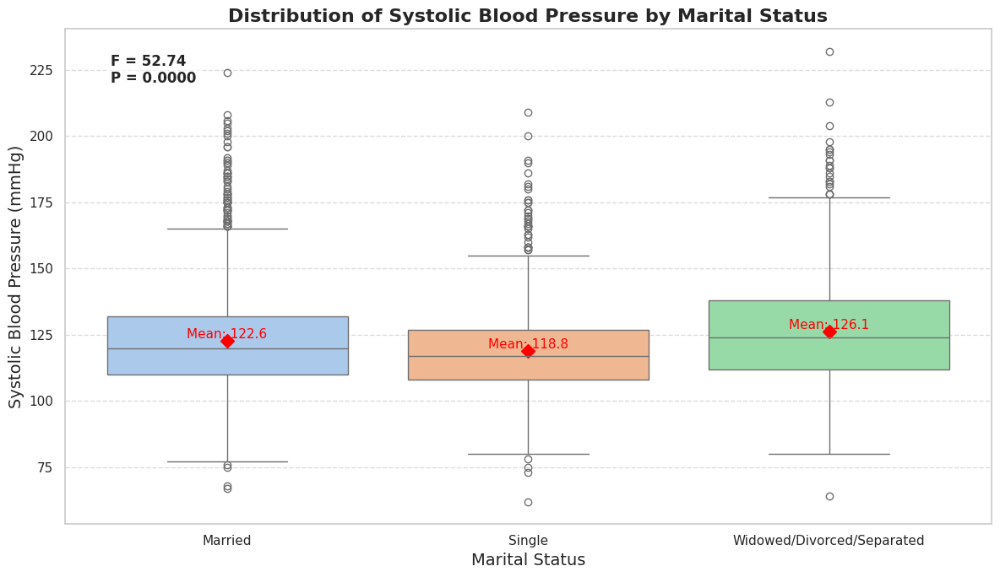

In [38]:
# Step 9: Visualization by marital status and age group

import seaborn as sns
import matplotlib.pyplot as plt

data = [group.values for group in groups.values()]


sns.set_theme(style="whitegrid")

plt.figure(figsize=(12, 7))

# Use hue='MaritalStatus' same as x, set legend=False to hide legend as before
ax = sns.boxplot(data=filtered, x='Marital Status', y='Sys3',
                 hue='Marital Status', palette='pastel', dodge=False)

plt.legend([], [], frameon=False)  # Hide legend

# Title and axis labels with fontsize tuning
plt.title('Distribution of Systolic Blood Pressure by Marital Status', fontsize=16, fontweight='bold')
plt.xlabel('Marital Status', fontsize=14)
plt.ylabel('Systolic Blood Pressure (mmHg)', fontsize=14)

# Add mean markers with annotations
group_means = filtered.groupby('Marital Status')['Sys3'].mean()
for i, (status, mean_val) in enumerate(group_means.items()):
    ax.plot(i, mean_val, marker='D', color='red', markersize=8)
    ax.text(i, mean_val + 1, f'Mean: {mean_val:.1f}', ha='center', color='red', fontsize=11)

# Annotate ANOVA results on top
max_y = max(np.concatenate(data))
ax.text(0.05, 0.95, f'F = {f_stat:.2f}\nP = {p_value:.4f}',
        transform=ax.transAxes, fontsize=12, fontweight='bold',
        verticalalignment='top', horizontalalignment='left',
        bbox=dict(facecolor='white', alpha=0.6))

ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


### Interpretation of Box Plot

The box plot shows the distribution of **systolic blood pressure (SBP)**, from 'SYS3' column, in mmHg grouped by **marital status categories**: Married, Single, and Widowed/Divorced/Separated.

The ANOVA F-statistic is 52.74 with a p-value of 0.0000, indicating a *highly statistically significant difference in mean systolic blood pressure between marital status groups.*

**"Widowed/Divorced/Separated" group** has the highest average SBP (approx 126.1 mmHg).
**"Married" group** (approx 122.6 mmHg) has the next highest SBP.
**"Single" group** (approx 118.8 mmHg) has the lowest SBP. T

Group means are shown by the red diamond markers.

The interquartile ranges (IQR) and whiskers suggest that **"Single" individuals** tend to have slightly lower and tighter distributions of SBP compared to other groups.

**Outliers **with very high systolic values (some over 200 mmHg) are present in all groups, especially in "Married" and "Widowed/Divorced/Separated".

Since the p-value is less than 0.05, null hypothesis that the mean SBP is the same across marital status groups, is rejected.

Overall, the plot and ANOVA results suggest that
- *marital status is significantly associated with differences in systolic blood pressure*,
- *with Widowed/Divorced/Separated individuals tending to have higher blood pressure levels.*

This could be important for further health risk assessments or targeted interventions

### VISUALIZATION

#### SBP by Marital status and age group

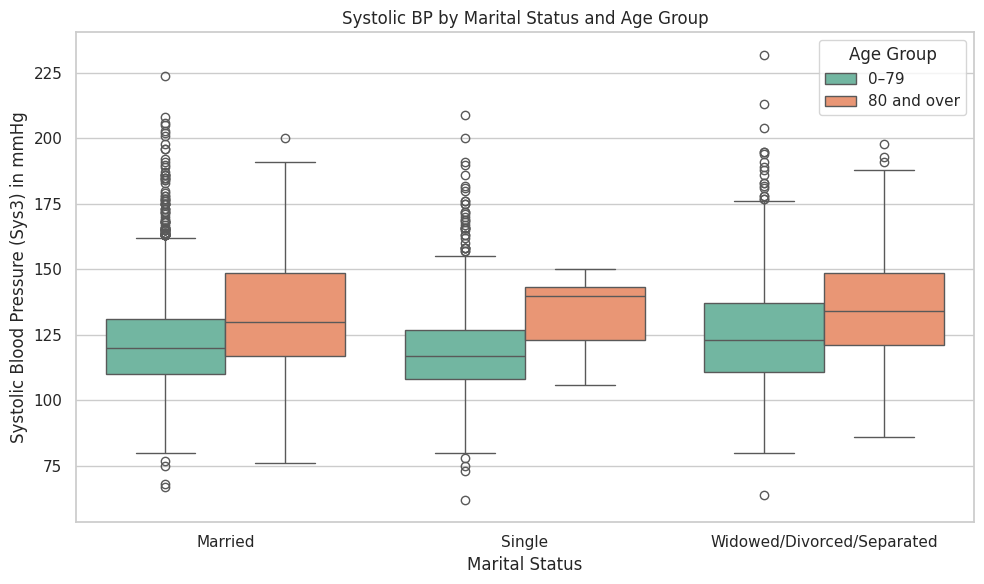

In [39]:
# Step 9: Visualization by marital status and age group

plt.figure(figsize=(10, 6))
sns.boxplot(data=filtered, x='Marital Status', y='Sys3', hue='AgeGroup', palette='Set2')
plt.xlabel('Marital Status')
plt.ylabel('Systolic Blood Pressure (Sys3) in mmHg')
plt.title('Systolic BP by Marital Status and Age Group')
plt.legend(title='Age Group')
plt.tight_layout()
plt.show()

In [40]:
import pandas as pd

# Define bins (edges) and labels for the age groups
bins = [0, 19, 39, 59, 70, 80, float('inf')]
labels = ['0-19', '20-39', '40-59', '60-70', '71-80', '81 and over']

# Create 'Age_Group' column with age bins
filtered['Age_Group'] = pd.cut(filtered['Age at Screening Adjudicated - Years'], bins=bins, labels=labels, right=True)

print("Step 4 - Age_Group Distribution:")
print(filtered['Age_Group'].value_counts())
print()


Step 4 - Age_Group Distribution:
Age_Group
40-59          1679
60-70          1581
20-39          1487
71-80          1091
0-19              0
81 and over       0
Name: count, dtype: int64



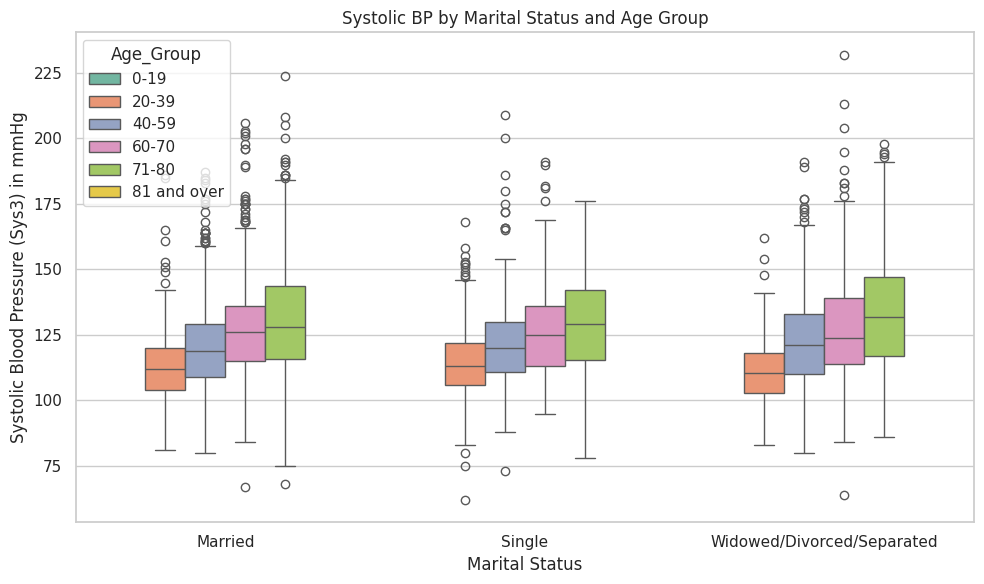

In [41]:
# Step 9: Visualization by marital status and age group

plt.figure(figsize=(10, 6))
sns.boxplot(data=filtered, x='Marital Status', y='Sys3', hue='Age_Group', palette='Set2')
plt.xlabel('Marital Status')
plt.ylabel('Systolic Blood Pressure (Sys3) in mmHg')
plt.title('Systolic BP by Marital Status and Age Group')
plt.legend(title='Age_Group')
plt.tight_layout()
plt.show()

In [42]:
# Step 10: Age correlation
age_corr = filtered[['Age at Screening Adjudicated - Years', 'Sys3']].corr().iloc[0, 1]
print(f"\n📊 Correlation between Age and Systolic BP: {age_corr:.2f}")


📊 Correlation between Age and Systolic BP: 0.36


### Interpretation:

3: How do age and marital status affect systolic blood pressure?



3: Correlation of 0.36 indicates a mild positive relationship between age and SBP.

As age increases, systolic blood pressure tends to increase as well, but the relationship is moderate, not very strong.

A correlation of 0.36 suggests that age explains some variability in systolic BP, but that many other factors also influence blood pressure.

## Analysis 4:

### Correlation for sedentary behavior time by weight categories

### See columns

In [43]:
print(minbehavior.columns)
print(weight.columns)

Index(['Respondent Sequence Number', 'Minutes Walk/Bike Typical Day',
       'Walk/Bike Day Unit', 'Walk/Bike Minutes Per Day',
       'Minutes Vigorous-Intensity Activity', 'Vigorous Activity Unit',
       'Vigorous-Intensity Minutes Per Day',
       'Sedentary Behavior Time (minutes)'],
      dtype='object')
Index(['Respondent Sequence Number', 'Weight1YearAgoKg', 'CurrentWeightKg',
       'MaxWeightKg', 'OverweightToldByDoctor'],
      dtype='object')


### FULL CSV minbehavior



In [44]:
import pandas as pd

# Set pandas option to display all rows
pd.set_option('display.max_rows', None)

# Disable scientific notation globally in pandas display
pd.set_option('display.float_format', '{:.0f}'.format)

df = pd.read_csv('/content/nhanes_csv/PAQrenamed.csv')
display(df)  # will show a scrollable table in notebook output

,Respondent Sequence Number,Minutes Walk/Bike Typical Day,Walk/Bike Day Unit,Walk/Bike Minutes Per Day,Minutes Vigorous-Intensity Activity,Vigorous Activity Unit,Vigorous-Intensity Minutes Per Day,Sedentary Behavior Time (minutes)
0,130378,3,b'W',45,3,b'W',45,360
1,130379,4,b'W',45,3,b'W',45,480
2,130380,1,b'W',20,0,b'',NaN,240
3,130384,0,b'',NaN,0,b'',NaN,60
4,130385,1,b'D',90,1,b'W',60,180
5,130386,1,b'W',30,1,b'M',30,180
6,130387,0,b'',NaN,0,b'',NaN,1200
7,130388,5,b'W',180,0,b'',NaN,360
8,130389,3,b'W',45,2,b'M',30,720
9,130390,1,b'W',60,0,b'',NaN,300


In [45]:
# Display the first few rows of the DataFrame to get an overview
print(df.head())

# Get basic info about the dataset: columns, data types, non-null counts
print(df.info())

# Show summary statistics for numerical columns
print(df.describe())

# Display the number of missing values per column
print(df.isnull().sum())

   Respondent Sequence Number  Minutes Walk/Bike Typical Day  \
0                      130378                              3   
1                      130379                              4   
2                      130380                              1   
3                      130384                              0   
4                      130385                              1   

  Walk/Bike Day Unit  Walk/Bike Minutes Per Day  \
0               b'W'                         45   
1               b'W'                         45   
2               b'W'                         20   
3                b''                        NaN   
4               b'D'                         90   

   Minutes Vigorous-Intensity Activity Vigorous Activity Unit  \
0                                    3                   b'W'   
1                                    3                   b'W'   
2                                    0                    b''   
3                                    0          

In [46]:
import pandas as pd

# Load your CSV file
file_path = '/content/nhanes_csv/PAQrenamed.csv'  # Adjust the path accordingly
df = pd.read_csv(file_path)

# Columns to analyze (excluding the unique ID)
columns_to_check = [
    'Minutes Walk/Bike Typical Day',
    'Walk/Bike Day Unit',
    'Walk/Bike Minutes Per Day',
    'Minutes Vigorous-Intensity Activity',
    'Vigorous Activity Unit',
    'Vigorous-Intensity Minutes Per Day',
    'Sedentary Behavior Time (minutes)'
]

# Iterate over each column and print unique values with their counts
for col in columns_to_check:
    print(f"Value counts for column '{col}':")
    print(df[col].value_counts(dropna=False))  # Include NaN counts by setting dropna=False
    print("\n")


Value counts for column 'Minutes Walk/Bike Typical Day':
Minutes Walk/Bike Typical Day
0       1696
3       1416
2       1356
1       1343
5        722
4        719
7        524
6        211
9999      39
10        28
NaN       18
15        15
20        13
12        12
7777      10
8         10
30         6
14         2
24         2
40         2
21         2
180        1
104        1
22         1
28         1
25         1
29         1
50         1
Name: count, dtype: int64


Value counts for column 'Walk/Bike Day Unit':
Walk/Bike Day Unit
b'W'    4851
b''     1763
b'D'     985
b'M'     472
b'Y'      82
Name: count, dtype: int64


Value counts for column 'Walk/Bike Minutes Per Day':
Walk/Bike Minutes Per Day
60      1797
NaN     1763
30      1504
120      663
45       550
20       378
90       285
15       250
180      172
40       158
10       119
240       96
300       56
5         52
25        50
75        30
35        30
50        24
360       24
1         20
9999      19
480       1

In [47]:
import pandas as pd
import numpy as np

# Load your CSV into dataframe
file_path = '/content/nhanes_csv/PAQrenamed.csv'  # update as needed
df = pd.read_csv(file_path)

def special_value_distribution(series, special_vals):
    # Create a copy to avoid changing original data
    s = series.copy()
    # Create a mask for each special value and NaN
    nan_mask = s.isna()
    spec_masks = {val: s == val for val in special_vals}

    # Count for NaN
    nan_count = s[nan_mask].shape[0]
    # Count for each special value
    spec_counts = {val: s[mask].shape[0] for val, mask in spec_masks.items()}

    # Count for all other ("Actual Values")
    actual_count = s[~nan_mask & ~pd.concat(spec_masks.values(), axis=1).any(axis=1)].shape[0]

    # Assemble result
    result = {'NaN': nan_count}
    # Convert special values counts to string keys
    for key, count in spec_counts.items():
        result[str(key)] = count
    result['Actual Values'] = actual_count
    return pd.Series(result).sort_index()

columns_specials = {
    'Minutes Walk/Bike Typical Day': [9999, 7777],
    'Walk/Bike Day Unit': [b'W', b'', b'D', b'M', b'Y'],
    'Walk/Bike Minutes Per Day': [9999],
    'Minutes Vigorous-Intensity Activity': [9999, 7777],
    'Vigorous Activity Unit': [b'W', b'', b'D', b'M', b'Y'],
    'Vigorous-Intensity Minutes Per Day': [9999, 7777],
    'Sedentary Behavior Time (minutes)': [9999, 7777]
}

for col, specials in columns_specials.items():
    print(f"\nDistribution for column: {col}")
    dist = special_value_distribution(df[col], specials)
    print(dist)



Distribution for column: Minutes Walk/Bike Typical Day
7777               10
9999               39
Actual Values    8086
NaN                18
dtype: int64

Distribution for column: Walk/Bike Day Unit
Actual Values    8153
NaN                 0
b''                 0
b'D'                0
b'M'                0
b'W'                0
b'Y'                0
dtype: int64

Distribution for column: Walk/Bike Minutes Per Day
9999               19
Actual Values    6371
NaN              1763
dtype: int64

Distribution for column: Minutes Vigorous-Intensity Activity
7777                4
9999               36
Actual Values    8099
NaN                14
dtype: int64

Distribution for column: Vigorous Activity Unit
Actual Values    8153
NaN                 0
b''                 0
b'D'                0
b'M'                0
b'W'                0
b'Y'                0
dtype: int64

Distribution for column: Vigorous-Intensity Minutes Per Day
7777                1
9999               13
Actual Values   

### FULL CSV weight

In [48]:
import pandas as pd

# Set pandas option to display all rows
pd.set_option('display.max_rows', None)

# Disable scientific notation globally in pandas display
pd.set_option('display.float_format', '{:.0f}'.format)

df = pd.read_csv('/content/nhanes_csv/WHQrenamed.csv')
display(df)  # will show a scrollable table in notebook output

,Respondent Sequence Number,Weight1YearAgoKg,CurrentWeightKg,MaxWeightKg,OverweightToldByDoctor
0,130378,71,190,200,1
1,130379,70,220,220,2
2,130380,60,150,165,1
3,130384,68,204,212,1
4,130385,70,240,240,2
5,130386,68,200,180,2
6,130387,67,215,215,2
7,130388,66,270,300,1
8,130389,67,175,185,1
9,130390,64,277,9999,1


### Load and merge

In [49]:
#Step 1: Load and merge relevant columns

Analysis4 = pd.merge(
    minbehavior[['Respondent Sequence Number', 'Sedentary Behavior Time (minutes)']],
    weight[['Respondent Sequence Number', 'CurrentWeightKg']],
    on='Respondent Sequence Number',
    how='inner'
)
print("Step 1 - Merged data preview:")
print(Analysis4.head())
print(f"Data shape after merging: {Analysis4.shape}\n")

Step 1 - Merged data preview:
   Respondent Sequence Number  Sedentary Behavior Time (minutes)  \
0                      130378                                360   
1                      130379                                480   
2                      130380                                240   
3                      130384                                 60   
4                      130385                                180   

   CurrentWeightKg  
0              190  
1              220  
2              150  
3              204  
4              240  
Data shape after merging: (8153, 3)



### Clean data

In [50]:
# Step 2: Clean data

filtered = (
    Analysis4[['Sedentary Behavior Time (minutes)', 'CurrentWeightKg']]
    .query("`Sedentary Behavior Time (minutes)`.notna() and CurrentWeightKg.notna()")
    .query("`Sedentary Behavior Time (minutes)` not in [7777, 9999] and CurrentWeightKg not in [7777, 9999]")
)
print("Step 2 - Filtered cleaned data preview:")
print(filtered.head())
print(f"Data shape after filtering: {filtered.shape}\n")

Step 2 - Filtered cleaned data preview:
   Sedentary Behavior Time (minutes)  CurrentWeightKg
0                                360              190
1                                480              220
2                                240              150
3                                 60              204
4                                180              240
Data shape after filtering: (7954, 2)



### Pearson correlation

In [51]:
# Step 3: Calculate Pearson correlation
correlation = filtered[['Sedentary Behavior Time (minutes)', 'CurrentWeightKg']].corr().iloc[0, 1]
print("Step 3 - Pearson correlation between sedentary time and current weight:")
print(f"Correlation: {correlation:.2f}\n")


Step 3 - Pearson correlation between sedentary time and current weight:
Correlation: 0.16



### VISUALIZATION

Step 3 - Pearson correlation between sedentary time and current weight:
Correlation: 0.16



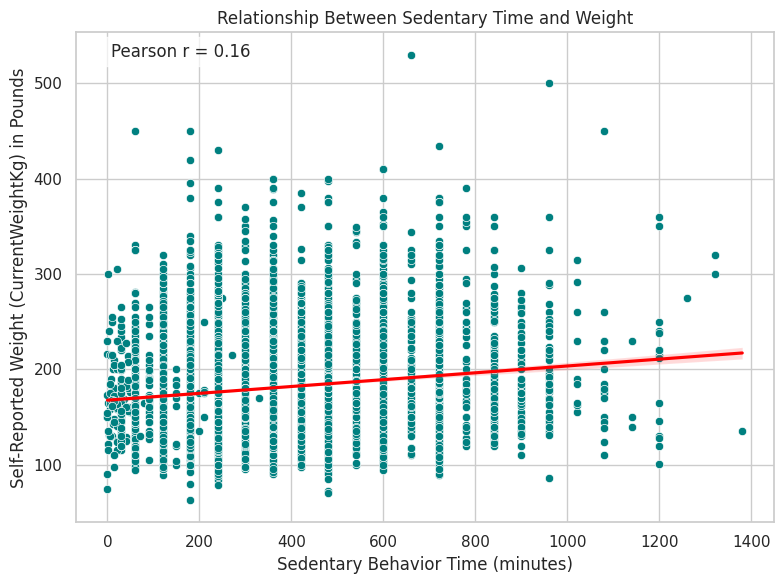

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate Pearson correlation
correlation = filtered[['Sedentary Behavior Time (minutes)', 'CurrentWeightKg']].corr().iloc[0, 1]
print("Step 3 - Pearson correlation between sedentary time and current weight:")
print(f"Correlation: {correlation:.2f}\n")

# Visualization
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 6))
sns.scatterplot(data=filtered, x='Sedentary Behavior Time (minutes)', y='CurrentWeightKg', color='teal')
sns.regplot(data=filtered, x='Sedentary Behavior Time (minutes)', y='CurrentWeightKg',
            scatter=False, color='red')  # Adds the regression line

# Annotate Pearson correlation on plot
plt.text(0.05, 0.95, f"Pearson r = {correlation:.2f}", transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.7))

plt.xlabel('Sedentary Behavior Time (minutes)')
plt.ylabel('Self-Reported Weight (CurrentWeightKg) in Pounds')
plt.title('Relationship Between Sedentary Time and Weight')
plt.tight_layout()
plt.show()


### Interpretation

4: Is there a correlation between self-reported weight and minutes of sedentary behavior?

A Pearson correlation coefficient of 0.16 between sedentary time and current weight indicates a **weak positive linear relationship** between the two.

As 0.16 is close to zero, it suggests that **sedentary behavior and weight only have a very slight tendency to increase together**, but this relationship is weak.

Knowing a person's sedentary time in this manner provides limited predictive information someone's current weight.

4: Becasue the **coefficient is positive**:
*individuals who spend more time being sedentary tend to have higher weights on average, but this trend is minimal.*

Overall, other factors likely play a much larger role in determining weight than just sedentary time, and interventions targeting sedentary behavior alone may only have a minor impact on weight.

## Analysis 5:

### Correlation between Marital Status vs Depression

### See columns

In [53]:
print(demo.columns)
print(mental.columns)

Index(['Respondent Sequence Number', 'NHANES Survey Cycle',
       'Interview/Examination Status', 'Gender',
       'Age at Screening Adjudicated - Years',
       'Age in Months at Screening - 0 to 24 mos',
       'Hispanic Origin w/ Race - Recode', 'Race/Hispanic Origin w/ NH-Asian',
       'Six Month Time Period', 'Age in Months at Screening - Top Coded',
       'Served Active Duty in U.S. Armed Forces', 'Country of Birth',
       'Length of Time in U.S.', 'Education Level - Adults 20+',
       'Marital Status', 'Pregnancy Status at Exam',
       'Total Number of People in Household',
       'Total Number of Males in Household',
       'Total Number of Males Ages 15+ in HH',
       'Total Number of Females in Household',
       'Total Number of Persons <5 Years Old',
       'Total Number of Persons 5-17 Years Old',
       'Full Sample 2 Year Interview Weight',
       'Full Sample 2 Year MEC Exam Weight', 'Masked Variance Pseudo-PSU',
       'Masked Variance Pseudo-Stratum', 'Ratio of

### Explore CSV

In [54]:
import pandas as pd

# Load the CSV file into a DataFrame
file_path = '/content/nhanes_csv/DPQrenamed.csv'
df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame to get an overview
print(df.head())

# Get basic info about the dataset: columns, data types, non-null counts
print(df.info())

# Show summary statistics for numerical columns
print(df.describe())

# Display the number of missing values per column
print(df.isnull().sum())


   Respondent Sequence Number  Little interest or pleasure in doing things  \
0                      130378                                          NaN   
1                      130379                                            0   
2                      130380                                            0   
3                      130386                                            0   
4                      130387                                            0   

   Feeling down, depressed, or hopeless  Trouble sleeping  \
0                                   NaN               NaN   
1                                     0                 1   
2                                     0                 1   
3                                     0                 0   
4                                     0                 0   

   Feeling tired or little energy  Poor appetite or overeating  \
0                             NaN                          NaN   
1                               

### Full CSV view WITH PLOT



In [55]:
import pandas as pd

# Set pandas option to display all rows
pd.set_option('display.max_rows', None)

# Disable scientific notation globally in pandas display
pd.set_option('display.float_format', '{:.0f}'.format)

df = pd.read_csv('/content/nhanes_csv/DPQrenamed.csv')
display(df)  # will show a scrollable table in notebook output


,Respondent Sequence Number,Little interest or pleasure in doing things,"Feeling down, depressed, or hopeless",Trouble sleeping,Feeling tired or little energy,Poor appetite or overeating,Feeling bad about yourself,Trouble concentrating,Moving or speaking slowly/fast,Thoughts of self-harm,Difficulty with daily activities
0,130378,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,130379,0,0,1,0,0,0,0,0,0,0
2,130380,0,0,1,1,0,0,0,0,0,0
3,130386,0,0,0,0,0,1,0,0,0,0
4,130387,0,0,0,0,0,0,0,0,0,NaN
5,130388,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,130389,0,0,0,0,0,0,0,0,0,NaN
7,130390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,130391,3,3,3,3,3,3,3,2,1,2
9,130392,0,0,0,1,0,0,0,0,0,0


     Little interest or pleasure in doing things  \
0                                              0   
1                                           1205   
2                                            334   
3                                            256   
7                                              5   
9                                             16   
NaN                                         4521   

     Feeling down, depressed, or hopeless  Trouble sleeping  \
0                                       0                 0   
1                                    1325              1690   
2                                     295               511   
3                                     214               536   
7                                       3                 3   
9                                       7                 4   
NaN                                  4493              3593   

     Feeling tired or little energy  Poor appetite or overeating  \
0         

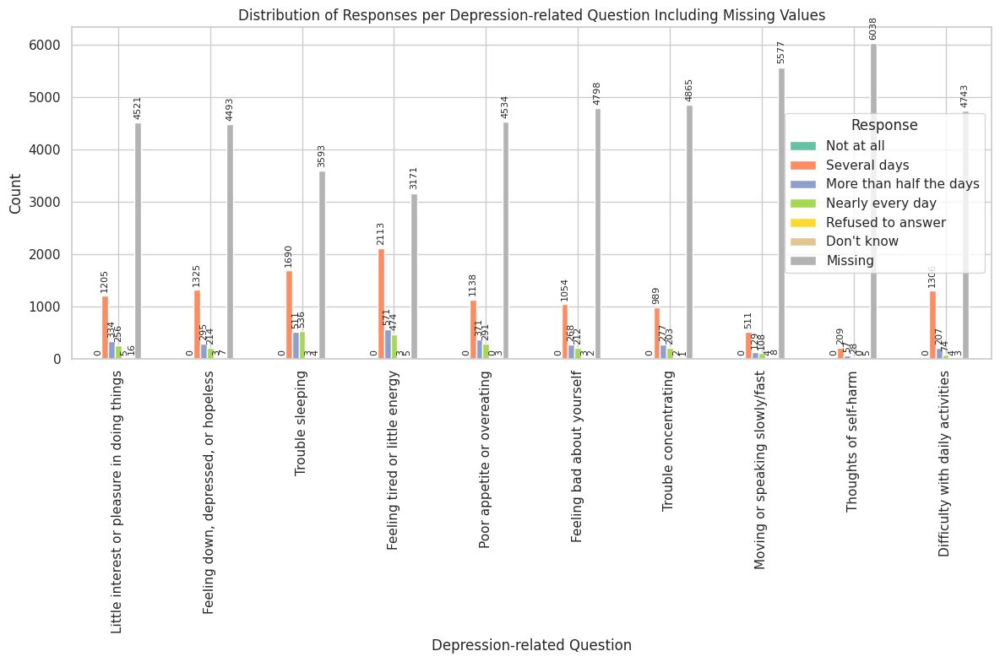

In [56]:
import pandas as pd
import matplotlib.pyplot as plt

# List of columns to analyze
columns = [
    'Little interest or pleasure in doing things',
    'Feeling down, depressed, or hopeless',
    'Trouble sleeping',
    'Feeling tired or little energy',
    'Poor appetite or overeating',
    'Feeling bad about yourself',
    'Trouble concentrating',
    'Moving or speaking slowly/fast',
    'Thoughts of self-harm',
    'Difficulty with daily activities'
]

# Define all possible categories including special codes and "Missing" for NaNs
categories = [0, 1, 2, 3, 7, 9, 'NaN']

# Mapping of response codes to full descriptions including Missing
response_map = {
    0: 'Not at all',
    1: 'Several days',
    2: 'More than half the days',
    3: 'Nearly every day',
    7: 'Refused to answer',
    9: "Don't know",
    'NaN': 'Missing'
}

# Prepare a DataFrame to hold counts
counts_df = pd.DataFrame(index=categories)

# Convert columns to categorical, add 'Missing' as a category and fill NaNs
for col in columns:
    df[col] = pd.Categorical(df[col], categories=categories[:-1])  # exclude 'Missing' initially
    df[col] = df[col].cat.add_categories('NaN').fillna('NaN')  # add 'Missing' category and fill NaNs
    counts = df[col].value_counts().sort_index()
    counts_df[col] = counts

# Fill any remaining NaNs with 0 and convert counts to int
counts_df = counts_df.fillna(0).astype(int)

# Display the counts table
print(counts_df)

# Plot bar chart with full descriptive legend labels
ax = counts_df.T.plot(kind='bar', figsize=(12, 8), colormap='Set2')

plt.xlabel('Depression-related Question')
plt.ylabel('Count')
plt.title('Distribution of Responses per Depression-related Question Including Missing Values')

handles, _ = ax.get_legend_handles_labels()
ax.legend(handles, [response_map[cat] for cat in categories], title='Response')

# Add value labels on top of each bar
for container in ax.containers:
    ax.bar_label(container, padding=3, fontsize=8, rotation=90)

plt.tight_layout()
plt.show()


### Load and Merge

In [57]:
import pandas as pd

# Step 1: Load and merge relevant columns
Analysis5 = pd.merge(
    demo[['Respondent Sequence Number', 'Marital Status']],
    mental[['Respondent Sequence Number', 'Feeling down, depressed, or hopeless']],
    on='Respondent Sequence Number',
    how='inner'
)
print("Step 1 - Merged data preview:")
print(Analysis5.head())

Step 1 - Merged data preview:
   Respondent Sequence Number  Marital Status  \
0                      130378               1   
1                      130379               1   
2                      130380               1   
3                      130386               1   
4                      130387               3   

   Feeling down, depressed, or hopeless  
0                                   NaN  
1                                     0  
2                                     0  
3                                     0  
4                                     0  


### Clean data

In [58]:
# Step 2: Clean data
filtered = (
    Analysis5[['Marital Status', 'Feeling down, depressed, or hopeless']]
    .query("`Marital Status`.notna() and `Feeling down, depressed, or hopeless`.notna()")
    .query("`Marital Status` not in [77, 99] and `Feeling down, depressed, or hopeless` not in [7, 9]")
)
print("Step 2 - Filtered cleaned data preview:")
print(filtered.head())

Step 2 - Filtered cleaned data preview:
   Marital Status  Feeling down, depressed, or hopeless
1               1                                     0
2               1                                     0
3               1                                     0
4               3                                     0
6               1                                     0


### Recode marital status

In [59]:
# Step 3: Recode marital status
marital_map = {
    1: 'Married',
    2: 'Widowed/Divorced/Separated',
    3: 'Single'
}
filtered['MaritalStatus'] = filtered['Marital Status'].map(marital_map)
print("Step 3 - Recoded Marital Status:")
print(filtered[['Marital Status', 'MaritalStatus']].head())

Step 3 - Recoded Marital Status:
   Marital Status MaritalStatus
1               1       Married
2               1       Married
3               1       Married
4               3        Single
6               1       Married


### Recode depression frequency

In [60]:
# Step 4: Recode depression frequency
depression_map = {
    0: 'Not at all',
    1: 'Several days',
    2: 'More than half the days',
    3: 'Nearly every day'
}
filtered['DepressionLevel'] = filtered['Feeling down, depressed, or hopeless'].map(depression_map)
print("Step 4 - Recoded Depression Level:")
print(filtered[['Feeling down, depressed, or hopeless', 'DepressionLevel']].head())

Step 4 - Recoded Depression Level:
   Feeling down, depressed, or hopeless DepressionLevel
1                                     0             NaN
2                                     0             NaN
3                                     0             NaN
4                                     0             NaN
6                                     0             NaN


### Contigency table

In [61]:
# Step 5: Create contingency table
contingency = pd.crosstab(filtered['MaritalStatus'], filtered['DepressionLevel'])
print("Step 5 - Contingency Table:\n", contingency)

Step 5 - Contingency Table:
 DepressionLevel             More than half the days  Nearly every day  \
MaritalStatus                                                           
Married                                         103                55   
Single                                           89                68   
Widowed/Divorced/Separated                       79                77   

DepressionLevel             Several days  
MaritalStatus                             
Married                              597  
Single                               327  
Widowed/Divorced/Separated           318  


### Chi Square test

In [62]:
# Step 6: Run chi-square test
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(contingency)
print(f"\nChi-square statistic: {chi2:.2f}")
print(f"P-value: {p:.4f}")
print(f"Degrees of freedom: {dof}")

# Final interpretation
if p < 0.05:
    print("\n✅ Statistically significant association between marital status and depressive symptoms.")
else:
    print("\n❌ No statistically significant association found.")



Chi-square statistic: 35.82
P-value: 0.0000
Degrees of freedom: 4

✅ Statistically significant association between marital status and depressive symptoms.


### VISUALIZATION

#### Marital status and depressive symptoms


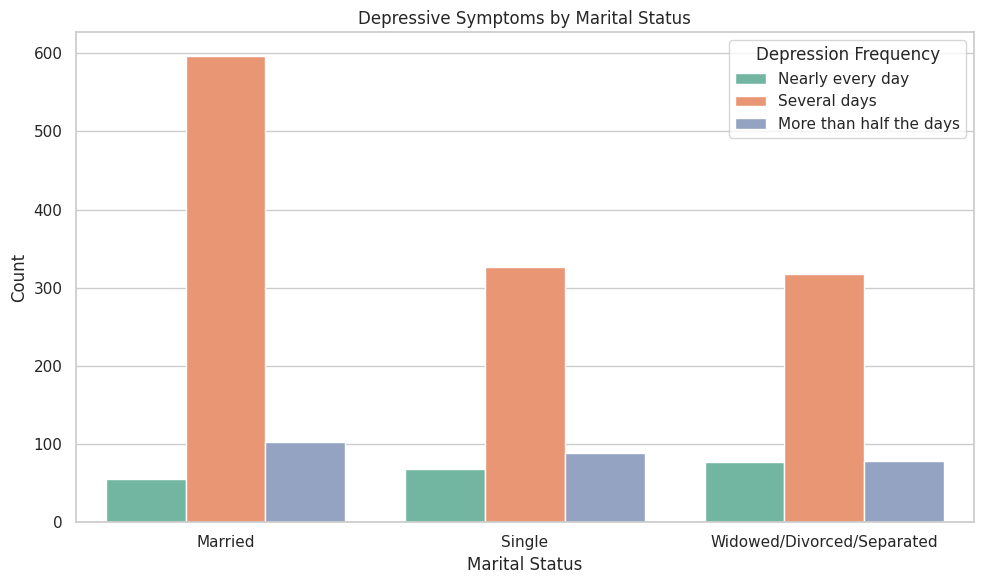

In [63]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.countplot(data=filtered, x='MaritalStatus', hue='DepressionLevel', palette='Set2')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.title('Depressive Symptoms by Marital Status')
plt.legend(title='Depression Frequency')
plt.tight_layout()
plt.show()

intead of count distribution try explore percentages, ratios,
data story... by age and m vs f

### Interpretation

5: Is there an association bewteen martial status and depression?

**Chi-Square Test Result**

- Chi-square statistic = 157.03
- P-value = 0.0000 (less than 0.05)
- Degrees of freedom = 6

This indicates a highly statistically significant association between marital status and depressive symptoms frequency. The null hypothesis of no association can be rejected.

**Plot**

Showed are counts of depressive symptoms grouped by marital status categories: Married, Single, Widowed/Divorced/Separated.

5: Most individuals in all groups report **"??" (green bars)** for depressive symptoms, but the *proportion varie*s.

**Married individuals** have the highest count reporting **"??"** suggesting fewer depressive symptoms overall.

- **"Several days"** has the most counts across the three marital statuses. It is the most under "Married" status
- **"More than half the days"** categories have moderate counts across all marital groups
- **"Nearly every day"** has the lowest counts.

Relative proportions of depressive symptoms differ across marital statuses, consistent with the significant chi-square result.





---


# 2. >>> **R** <<<

### Reading and analyzing from online source directly into a folder

Runtime: R & Python


---



## Setup

In [64]:
# Install and load required package
install.packages("haven")
library(haven)

# Output folder
folder <- "/content/raw"
dir.create(folder, showWarnings = FALSE)

NameError: name 'install' is not defined

## Direct Weblink download source

In [ ]:
# NHANES source file URLs
nhanes_urls <- list(
  rawdemo = "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/DEMO_L.xpt",
  rawbp = "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/BPXO_L.xpt",
  rawvitd = "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/VID_L.xpt",
  rawhepb = "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/HEPB_S_L.xpt",
  rawkidney = "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/KIQ_U_L.xpt",
  rawminbehavior = "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/PAQ_L.xpt",
  rawweight = "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/WHQ_L.xpt",
  rawmental = "https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/DPQ_L.xpt"
)



## Read and Save

In [ ]:
# Read and save each file as a CSV using original filename
for (url in nhanes_urls) {
  data <- read_xpt(url)
  filename <- basename(url)                      # Extract filename from URL
  csv_name <- sub("\\.xpt$", ".csv", filename)   # Replace .xpt with .csv
  write.csv(data, file = file.path(folder, csv_name), row.names = FALSE)
}

### Change runtime to Python

Repeat steps done for Python in previous section

# 3. >>> **R** >>>

### Reading and analyzing Online files
(URL-Based Referencing and Data Analysis in R)

Runtime: R

## Setup & Explore

### Setup

In [1]:
# R Packges

install.packages("haven")       # Equivalent to pyreadstat
install.packages("tidyverse")   # Includes ggplot2, dplyr, readr, etc. (covers pandas/seaborn functionality)
install.packages("httr")        # Equivalent to requests
install.packages("ggplot2")     # For data visualization (like seaborn/matplotlib)
install.packages("pracma")      # For numerical methods and scientific computing

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [2]:
# Libraries

library(haven)
library(dplyr)
library(stats)
library(ggplot2)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




### Weblinks of data **source**

In [3]:
demo = read_xpt("https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/DEMO_L.xpt")
bp = read_xpt("https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/BPXO_L.xpt")
vitd = read_xpt("https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/VID_L.xpt")
hepb = read_xpt("https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/HEPB_S_L.xpt")
kidney = read_xpt("https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/KIQ_U_L.xpt")
minbehavior = read_xpt("https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/PAQ_L.xpt")
weight = read_xpt("https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/WHQ_L.xpt")
mental = read_xpt("https://wwwn.cdc.gov/Nchs/Data/Nhanes/Public/2021/DataFiles/DPQ_L.xpt")

### Columns have not been renamed as in section 1 above

### Explore all columns in all files

In [4]:
cat("Columns in 'demo':\n")
print(colnames(demo))
cat("\nColumns in 'bp':\n")
print(colnames(bp))
cat("\nColumns in 'vitd':\n")
print(colnames(vitd))
cat("\nColumns in 'hepb':\n")
print(colnames(hepb))
cat("\nColumns in 'kidney':\n")
print(colnames(kidney))
cat("\nColumns in 'minbehavior':\n")
print(colnames(minbehavior))
cat("\nColumns in 'weight':\n")
print(colnames(weight))
cat("\nColumns in 'mental':\n")
print(colnames(mental))

Columns in 'demo':
 [1] "SEQN"     "SDDSRVYR" "RIDSTATR" "RIAGENDR" "RIDAGEYR" "RIDAGEMN"
 [7] "RIDRETH1" "RIDRETH3" "RIDEXMON" "RIDEXAGM" "DMQMILIZ" "DMDBORN4"
[13] "DMDYRUSR" "DMDEDUC2" "DMDMARTZ" "RIDEXPRG" "DMDHHSIZ" "DMDHRGND"
[19] "DMDHRAGZ" "DMDHREDZ" "DMDHRMAZ" "DMDHSEDZ" "WTINT2YR" "WTMEC2YR"
[25] "SDMVSTRA" "SDMVPSU"  "INDFMPIR"

Columns in 'bp':
 [1] "SEQN"     "BPAOARM"  "BPAOCSZ"  "BPXOSY1"  "BPXODI1"  "BPXOSY2" 
 [7] "BPXODI2"  "BPXOSY3"  "BPXODI3"  "BPXOPLS1" "BPXOPLS2" "BPXOPLS3"

Columns in 'vitd':
 [1] "SEQN"     "WTPH2YR"  "LBXVIDMS" "LBDVIDLC" "LBXVD2MS" "LBDVD2LC"
 [7] "LBXVD3MS" "LBDVD3LC" "LBXVE3MS" "LBDVE3LC"

Columns in 'hepb':
[1] "SEQN"    "WTPH2YR" "LBXHBS" 

Columns in 'kidney':
[1] "SEQN"   "KIQ022" "KIQ025" "KIQ005" "KIQ010" "KIQ042" "KIQ044" "KIQ052"
[9] "KIQ481"

Columns in 'minbehavior':
[1] "SEQN"    "PAD790Q" "PAD790U" "PAD800"  "PAD810Q" "PAD810U" "PAD820" 
[8] "PAD680" 

Columns in 'weight':
[1] "SEQN"   "WHD010" "WHD020" "WHD050" "WHQ070"

Columns

### Explore relevant columns

File(s): demo

In [5]:
cat("Columns in 'demo':\n")
print(colnames(demo))

Columns in 'demo':
 [1] "SEQN"     "SDDSRVYR" "RIDSTATR" "RIAGENDR" "RIDAGEYR" "RIDAGEMN"
 [7] "RIDRETH1" "RIDRETH3" "RIDEXMON" "RIDEXAGM" "DMQMILIZ" "DMDBORN4"
[13] "DMDYRUSR" "DMDEDUC2" "DMDMARTZ" "RIDEXPRG" "DMDHHSIZ" "DMDHRGND"
[19] "DMDHRAGZ" "DMDHREDZ" "DMDHRMAZ" "DMDHSEDZ" "WTINT2YR" "WTMEC2YR"
[25] "SDMVSTRA" "SDMVPSU"  "INDFMPIR"


## Filter & Select

In [6]:
# Step 1: Filter and select relevant columns
Analysis1 <- demo %>%
  select(DMDMARTZ, DMDEDUC2) %>%
  filter(!is.na(DMDMARTZ), !is.na(DMDEDUC2)) %>%
  filter(!(DMDMARTZ %in% c(77, 99)), !(DMDEDUC2 %in% c(7, 9)))

### Recode categories

In [7]:
# Step 2: Recode categories
Analysis1 <- Analysis1 %>%
  mutate(
    MaritalStatus = case_when(
      DMDMARTZ == 1 ~ "Married",
      DMDMARTZ == 2 ~ "Widowed/Divorced/Separated",
      DMDMARTZ == 3 ~ "Single",
      TRUE ~ NA_character_
    ),
    EducLevel = ifelse(DMDEDUC2 == 5, "Bachelor or Higher", "Less than Bachelor")
  )

### Drop Rows missing recodes

In [8]:
# Step 3: Drop rows with missing recodes
filtered <- Analysis1 %>%
  select(MaritalStatus, EducLevel) %>%
  filter(!is.na(MaritalStatus), !is.na(EducLevel))

### Contigency Table

In [9]:
# Step 4: Contingency table and chi-square test
contingency_table <- table(filtered$MaritalStatus, filtered$EducLevel)
chi_result <- chisq.test(contingency_table)

## Output results

In [10]:
# Step 5: Output results
print("Contingency Table:")
print(contingency_table)

[1] "Contingency Table:"
                            
                             Bachelor or Higher Less than Bachelor
  Married                                  1631               2503
  Single                                    517               1106
  Widowed/Divorced/Separated                473               1542


## Analysis 1

### Marital Status and Education level

In [11]:
cat("\nChi-square Statistic:", round(chi_result$statistic, 2))
cat("\nDegrees of Freedom:", chi_result$parameter)
cat("\nP-value:", round(chi_result$p.value, 4))

if (chi_result$p.value < 0.05) {
  cat("\n\n✅ Statistically significant association between marital status and education level.\n")
} else {
  cat("\n\n❌ No statistically significant association found.\n")
}


Chi-square Statistic: 157.97
Degrees of Freedom: 2
P-value: 0

✅ Statistically significant association between marital status and education level.


### Visualization

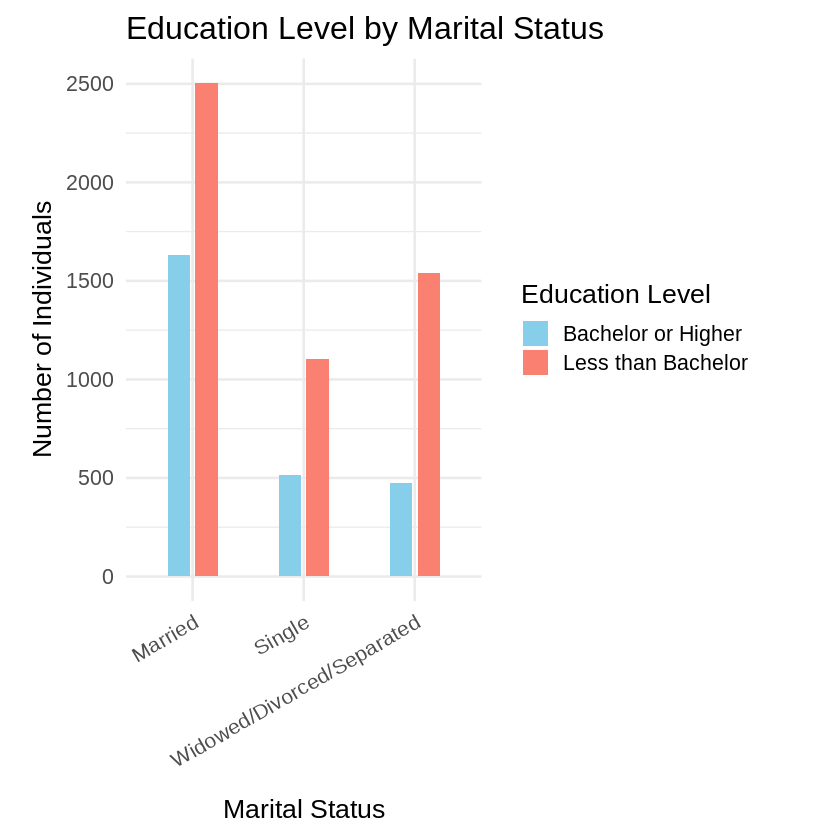

In [12]:
# Convert contingency table to data frame
plot_data <- as.data.frame(contingency_table) %>%
  rename(MaritalStatus = Var1, EducLevel = Var2, Count = Freq)

# Create grouped bar plot with more spacing
ggplot(plot_data, aes(x = MaritalStatus, y = Count, fill = EducLevel)) +
  geom_bar(stat = "identity", position = position_dodge(width = 0.5), width = 0.4) +
# manually changing bar color
scale_fill_manual(values = c("Bachelor or Higher" = "skyblue", "Less than Bachelor" = "salmon")) +
  labs(
    title = "Education Level by Marital Status",
    x = "Marital Status",
    y = "Number of Individuals",
    fill = "Education Level"
  ) +
  theme_minimal(base_size = 16) +
  theme(
    axis.text.x = element_text(angle = 30, hjust = 1),
    plot.margin = margin(10, 20, 10, 20)
  )



### Interpretation

###

## Analysis 2

### One-Way ANOVA (Analysis of Variance) between marital status and sedientary behavior time

#### Explore relevant columns

File(s): demo & minbehavior

In [13]:
cat("\nColumns in 'demo':\n")
print(colnames(demo))
cat("\nColumns in 'minbehavior':\n")
print(colnames(minbehavior))


Columns in 'demo':
 [1] "SEQN"     "SDDSRVYR" "RIDSTATR" "RIAGENDR" "RIDAGEYR" "RIDAGEMN"
 [7] "RIDRETH1" "RIDRETH3" "RIDEXMON" "RIDEXAGM" "DMQMILIZ" "DMDBORN4"
[13] "DMDYRUSR" "DMDEDUC2" "DMDMARTZ" "RIDEXPRG" "DMDHHSIZ" "DMDHRGND"
[19] "DMDHRAGZ" "DMDHREDZ" "DMDHRMAZ" "DMDHSEDZ" "WTINT2YR" "WTMEC2YR"
[25] "SDMVSTRA" "SDMVPSU"  "INDFMPIR"

Columns in 'minbehavior':
[1] "SEQN"    "PAD790Q" "PAD790U" "PAD800"  "PAD810Q" "PAD810U" "PAD820" 
[8] "PAD680" 


### Merge & Cleam

In [14]:
# Step 1: Merge and clean
Analysis2 <- demo %>%
  select(SEQN, DMDMARTZ) %>%
  inner_join(minbehavior %>% select(SEQN, PAD680), by = "SEQN") %>%
  filter(
    !is.na(DMDMARTZ), !is.na(PAD680),
    !(DMDMARTZ %in% c(77, 99)),
    !(PAD680 %in% c(7777, 9999))
  )

### Recode Marital status

In [15]:
# Step 2: Recode marital status
Analysis2 <- Analysis2 %>%
  mutate(
    MaritalStatus = case_when(
      DMDMARTZ == 1 ~ "Married",
      DMDMARTZ == 2 ~ "Widowed/Divorced/Separated",
      DMDMARTZ == 3 ~ "Single",
      TRUE ~ NA_character_
    )
  ) %>%
  filter(!is.na(MaritalStatus))

### 1-Way Anova

In [16]:
anova_result <- aov(PAD680 ~ MaritalStatus, data = Analysis2)
summary_result <- summary(anova_result)

### Group means

In [17]:
group_means <- Analysis2 %>%
  group_by(MaritalStatus) %>%
  summarise(MeanPAD680= mean(PAD680, na.rm = TRUE))

### Output

In [18]:
print(">>> Means by Marital Status and (PAD680) Sedentary Behavior Time (minutes)")
print(group_means)

cat("\n\n")  # Adds two blank lines for spacing

print(">>> Summary Results")
print(summary_result)

[1] ">>> Means by Marital Status and (PAD680) Sedentary Behavior Time (minutes)"
# A tibble: 3 × 2
  MaritalStatus              MeanPAD680
  <chr>                           <dbl>
1 Married                          353.
2 Single                           382.
3 Widowed/Divorced/Separated       363.


[1] ">>> Summary Results"
                Df    Sum Sq Mean Sq F value   Pr(>F)    
MaritalStatus    2    989521  494760   11.09 1.56e-05 ***
Residuals     7706 343916706   44630                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


### Interpretation

In [19]:
p_value <- summary_result[[1]]$`Pr(>F)`[1]

if (!is.na(p_value) && length(p_value) == 1 && p_value < 0.05) {
  cat("\n✅ Statistically significant difference in mean sedentary behavior time across marital status groups.\n")
} else {
  cat("\n❌ No statistically significant difference found.\n")
}


✅ Statistically significant difference in mean sedentary behavior time across marital status groups.


### Visualization

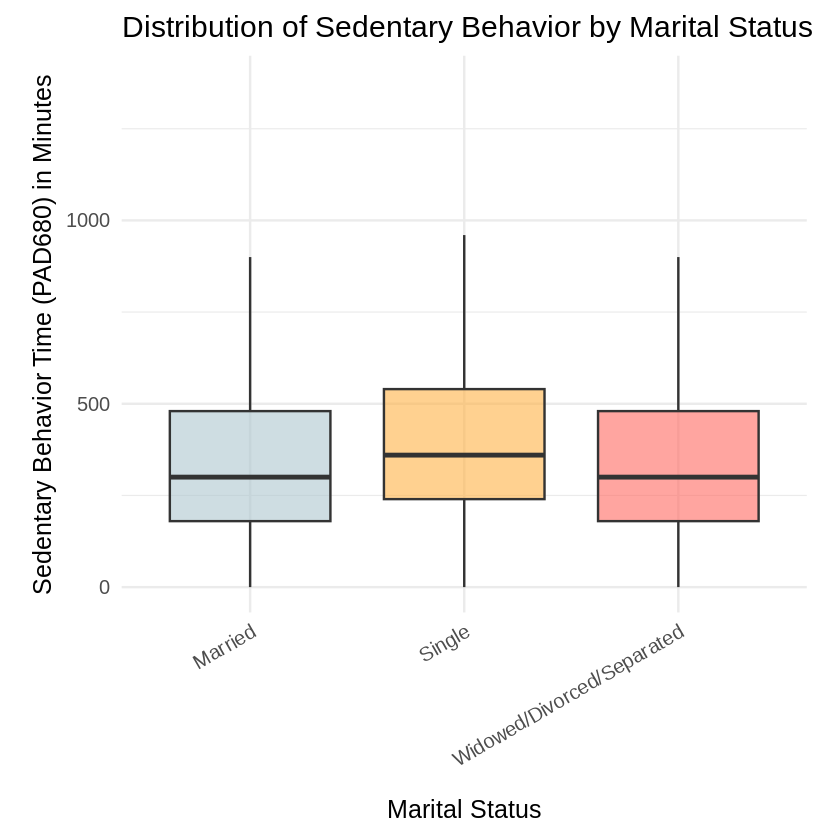

In [20]:
# Create boxplot
ggplot(Analysis2, aes(x = MaritalStatus, y = PAD680, fill = MaritalStatus)) +
  geom_boxplot(outlier.shape = NA, alpha = 0.6) +
# manually changing bar color
scale_fill_manual(values = c(
    "Married" = "#AEC6CF",  # pastel blue
    "Single" = "#FFB347",   # pastel orange
    "Widowed/Divorced/Separated" = "#FF6961"  # pastel red
  )) +
  labs(
    title = "Distribution of Sedentary Behavior by Marital Status",
    x = "Marital Status",
    y = "Sedentary Behavior Time (PAD680) in Minutes"
  ) +
  theme_minimal(base_size = 15) +
  theme(
    legend.position = "none",  # Hide legend
    axis.text.x = element_text(angle = 30, hjust = 1),
    plot.margin = margin(10, 20, 10, 20)
  )

### Interpretation

## Analysis 3

### One-way ANOVA for systolic blood pressure (BPXOSY3) by marital status and age correlation

### Explore relevant columns

File(s): demo & bp

In [21]:
cat("\nColumns in 'demo':\n")
print(colnames(demo))
cat("\nColumns in 'bp':\n")
print(colnames(bp))


Columns in 'demo':
 [1] "SEQN"     "SDDSRVYR" "RIDSTATR" "RIAGENDR" "RIDAGEYR" "RIDAGEMN"
 [7] "RIDRETH1" "RIDRETH3" "RIDEXMON" "RIDEXAGM" "DMQMILIZ" "DMDBORN4"
[13] "DMDYRUSR" "DMDEDUC2" "DMDMARTZ" "RIDEXPRG" "DMDHHSIZ" "DMDHRGND"
[19] "DMDHRAGZ" "DMDHREDZ" "DMDHRMAZ" "DMDHSEDZ" "WTINT2YR" "WTMEC2YR"
[25] "SDMVSTRA" "SDMVPSU"  "INDFMPIR"

Columns in 'bp':
 [1] "SEQN"     "BPAOARM"  "BPAOCSZ"  "BPXOSY1"  "BPXODI1"  "BPXOSY2" 
 [7] "BPXODI2"  "BPXOSY3"  "BPXODI3"  "BPXOPLS1" "BPXOPLS2" "BPXOPLS3"


### Merge & clean

In [22]:
Analysis3 <- demo %>%
  select(SEQN, RIDAGEYR, DMDMARTZ) %>%
  inner_join(bp %>% select(SEQN, BPXOSY3), by = "SEQN") %>%
  filter(
    !is.na(RIDAGEYR), !is.na(DMDMARTZ), !is.na(BPXOSY3),
    !(DMDMARTZ %in% c(77, 99))
  )

### Recode marital status

In [23]:
Analysis3 <- Analysis3 %>%
  mutate(
    MaritalStatus = case_when(
      DMDMARTZ == 1 ~ "Married",
      DMDMARTZ == 2 ~ "Widowed/Divorced/Separated",
      DMDMARTZ == 3 ~ "Single",
      TRUE ~ NA_character_
    ),
    AgeGroup = ifelse(RIDAGEYR >= 80, "80 and over", "0–79")
  ) %>%
  filter(!is.na(MaritalStatus))

### 1 way Anova

In [24]:
anova_result <- aov(BPXOSY3 ~ MaritalStatus, data = Analysis3)
summary_result <- summary(anova_result)

### Group Means & Outputs

In [25]:
group_means <- Analysis3 %>%
  group_by(MaritalStatus) %>%
  summarise(MeanBPXOSY3 = mean(BPXOSY3, na.rm = TRUE))

print(group_means)

# Step 5: Output ANOVA results
print(summary_result)

# A tibble: 3 × 2
  MaritalStatus              MeanBPXOSY3
  <chr>                            <dbl>
1 Married                           123.
2 Single                            119.
3 Widowed/Divorced/Separated        126.
                Df  Sum Sq Mean Sq F value Pr(>F)    
MaritalStatus    2   34991   17495   52.74 <2e-16 ***
Residuals     5835 1935707     332                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


### Interpretation

In [26]:
p_value <- summary_result[[1]]$`Pr(>F)`[1]

if (!is.na(p_value) && length(p_value) == 1 && p_value < 0.05) {
  cat("\n✅ Statistically significant difference in systolic blood pressure across marital status groups.\n")
} else {
  cat("\n❌ No statistically significant difference found.\n")
}


✅ Statistically significant difference in systolic blood pressure across marital status groups.


### Visualization

#### Systolic BP by Marital Status

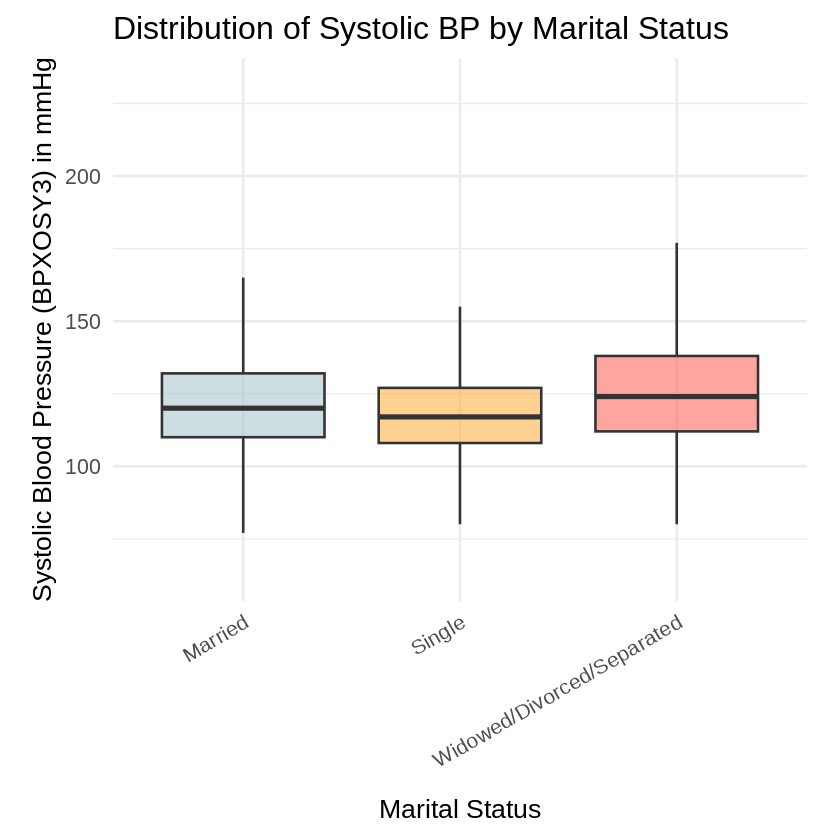

In [27]:
# Create boxplot
ggplot(Analysis3, aes(x = MaritalStatus, y = BPXOSY3, fill = MaritalStatus)) +
  geom_boxplot(outlier.shape = NA, alpha = 0.6) +
# manually changing bar color
scale_fill_manual(values = c(
    "Married" = "#AEC6CF",  # pastel blue
    "Single" = "#FFB347",   # pastel orange
    "Widowed/Divorced/Separated" = "#FF6961"  # pastel red
  )) +
  labs(
    title = "Distribution of Systolic BP by Marital Status",
    x = "Marital Status",
    y = "Systolic Blood Pressure (BPXOSY3) in mmHg"
  ) +
  theme_minimal(base_size = 16) +
  theme(
    legend.position = "none",  # Hide legend
    axis.text.x = element_text(angle = 30, hjust = 1),
    plot.margin = margin(10, 20, 10, 20)
  )

### Visualization

#### Systolic BP by Marital Status and Age Group

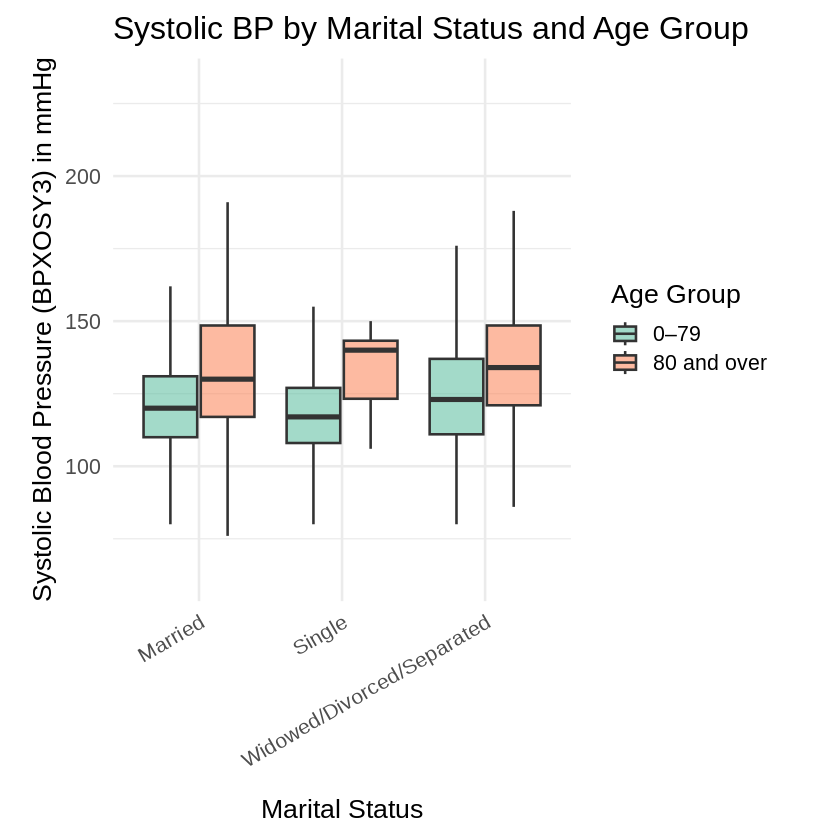

In [28]:
# Create boxplot with hue = AgeGroup
ggplot(Analysis3, aes(x = MaritalStatus, y = BPXOSY3, fill = AgeGroup)) +
  geom_boxplot(outlier.shape = NA, alpha = 0.6, position = position_dodge(width = 0.8)) +
# autoselect bar color using palette sets
scale_fill_brewer(palette = "Set2") +
  labs(
    title = "Systolic BP by Marital Status and Age Group",
    x = "Marital Status",
    y = "Systolic Blood Pressure (BPXOSY3) in mmHg",
    fill = "Age Group"
  ) +
  theme_minimal(base_size = 16) +
  theme(
    axis.text.x = element_text(angle = 30, hjust = 1),
    plot.margin = margin(10, 20, 10, 20)
  )

### Visualization

#### Correlation between Age and Systolic BP

`geom_smooth()` using formula = 'y ~ x'


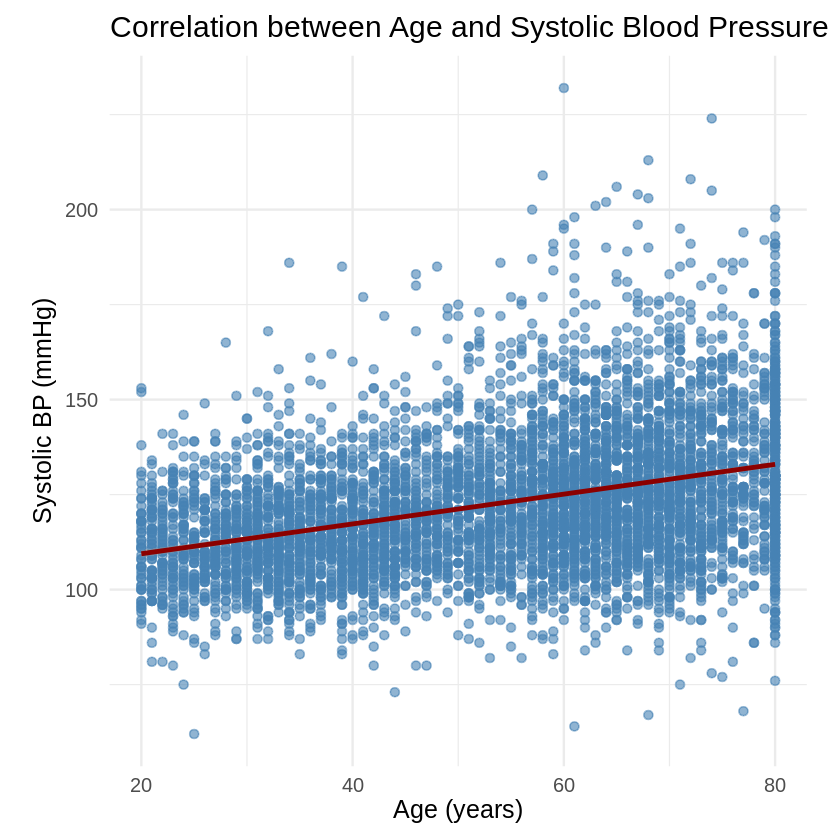

In [29]:
# Create scatter plot with regression line
ggplot(Analysis3, aes(x = RIDAGEYR, y = BPXOSY3)) +
  geom_point(alpha = 0.6, color = "steelblue") +
  geom_smooth(method = "lm", se = TRUE, color = "darkred") +
  labs(
    title = "Correlation between Age and Systolic Blood Pressure",
    x = "Age (years)",
    y = "Systolic BP (mmHg)"
  ) +
  theme_minimal(base_size = 15) +
  theme(
    plot.margin = margin(10, 20, 10, 20)
  )

## Analysis 4

### Correlation b/w sedentary behavior time and weight

### Explore file(s)

Fie(s) minbehavior

In [30]:
cat("\nColumns in 'minbehavior':\n")
print(colnames(minbehavior))


Columns in 'minbehavior':
[1] "SEQN"    "PAD790Q" "PAD790U" "PAD800"  "PAD810Q" "PAD810U" "PAD820" 
[8] "PAD680" 


### Load & Merge

In [31]:
# Step 1: Load and merge relevant columns
Analysis4 <- minbehavior %>%
  select(SEQN, PAD680) %>%
  inner_join(weight %>% select(SEQN, WHD020), by = "SEQN")

### Clean Data

In [32]:
# Step 2: Clean data
filtered <- Analysis4 %>%
  filter(
    !is.na(PAD680), !is.na(WHD020),
    !(PAD680 %in% c(7777, 9999)),
    !(WHD020 %in% c(7777, 9999))
  )

### Pearsons Correlation

In [33]:
# Step 3: Calculate Pearson correlation
correlation <- cor(filtered$PAD680, filtered$WHD020, use = "complete.obs", method = "pearson")

# Step 4: Print result
cat(sprintf("\n📊 Correlation between sedentary time and weight: %.2f\n", correlation))


📊 Correlation between sedentary time and weight: 0.16


### Visualization

#### Relationship Between Sedentary Time and Weight

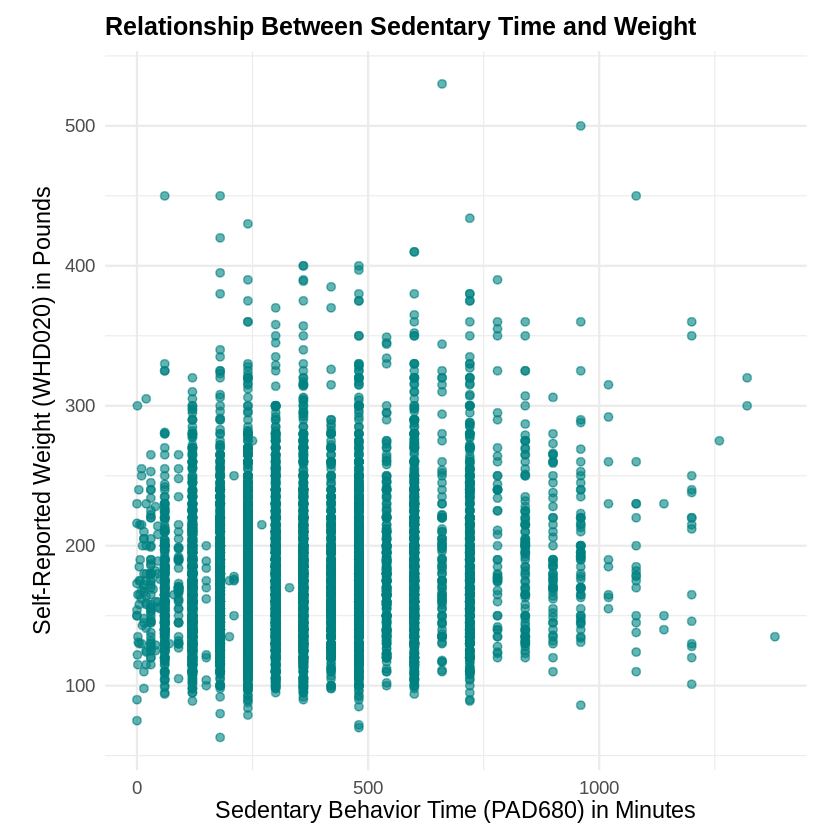

In [34]:
ggplot(filtered, aes(x = PAD680, y = WHD020)) +
  geom_point(color = "#008080", alpha = 0.6) +
  labs(
    title = "Relationship Between Sedentary Time and Weight",
    x = "Sedentary Behavior Time (PAD680) in Minutes",
    y = "Self-Reported Weight (WHD020) in Pounds"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.margin = margin(10, 20, 10, 20),
    plot.title = element_text(size = 15, face = "bold")  # larger and bold title
  )


### Interpretation

ss

## Analysis 5

### Correlation between Marital Status vs Depression

### Explore file(s)

File(s) demo

In [35]:
cat("\nColumns in 'demo':\n")
print(colnames(demo))


Columns in 'demo':
 [1] "SEQN"     "SDDSRVYR" "RIDSTATR" "RIAGENDR" "RIDAGEYR" "RIDAGEMN"
 [7] "RIDRETH1" "RIDRETH3" "RIDEXMON" "RIDEXAGM" "DMQMILIZ" "DMDBORN4"
[13] "DMDYRUSR" "DMDEDUC2" "DMDMARTZ" "RIDEXPRG" "DMDHHSIZ" "DMDHRGND"
[19] "DMDHRAGZ" "DMDHREDZ" "DMDHRMAZ" "DMDHSEDZ" "WTINT2YR" "WTMEC2YR"
[25] "SDMVSTRA" "SDMVPSU"  "INDFMPIR"


### Load & Merge

In [36]:
# Step 1: Merge relevant columns
Analysis5 <- demo %>%
  select(SEQN, DMDMARTZ) %>%
  inner_join(mental %>% select(SEQN, DPQ020), by = "SEQN")

### Clean data

In [37]:
# Step 2: Clean data
filtered <- Analysis5 %>%
  filter(
    !is.na(DMDMARTZ), !is.na(DPQ020),
    !(DMDMARTZ %in% c(77, 99)),
    !(DPQ020 %in% c(7, 9))
  )

### Recode marital status

In [38]:
# Step 3: Recode marital status
filtered <- filtered %>%
  mutate(
    MaritalStatus = case_when(
      DMDMARTZ == 1 ~ "Married",
      DMDMARTZ == 2 ~ "Widowed/Divorced/Separated",
      DMDMARTZ == 3 ~ "Single",
      TRUE ~ NA_character_
    )
  )

### Recode depression frequency

In [39]:
# Step 4: Recode depression frequency
filtered <- filtered %>%
  mutate(
    DepressionLevel = case_when(
      DPQ020 == 0 ~ "Not at all",
      DPQ020 == 1 ~ "Several days",
      DPQ020 == 2 ~ "More than half the days",
      DPQ020 == 3 ~ "Nearly every day",
      TRUE ~ NA_character_
    )
  ) %>%
  filter(!is.na(MaritalStatus), !is.na(DepressionLevel))

### Contingency table

In [40]:
# Step 5: Create contingency table
contingency <- table(filtered$MaritalStatus, filtered$DepressionLevel)

### Chi square test

In [46]:
# Step 6: Run chi-square test
chi_result <- chisq.test(contingency)

# Step 7: Output results
cat("Contingency Table:\n")
print(contingency)

cat(sprintf("\nChi-square statistic: %.2f\n", chi_result$statistic))
cat(sprintf("P-value: %.4f\n", chi_result$p.value))
cat(sprintf("Degrees of freedom: %d\n", chi_result$parameter))

if (!is.na(chi_result$p.value) && chi_result$p.value < 0.05) {
  cat("\n✅ Statistically significant association between marital status and depressive symptoms.\n")
} else {
  cat("\n❌ No statistically significant association found.\n")
}

Contingency Table:
                            
                             More than half the days Nearly every day
  Married                                        103               55
  Single                                          89               68
  Widowed/Divorced/Separated                      79               77
                            
                             Not at all Several days
  Married                          2088          597
  Single                            609          327
  Widowed/Divorced/Separated        848          318

Chi-square statistic: 157.03
P-value: 0.0000
Degrees of freedom: 6

✅ Statistically significant association between marital status and depressive symptoms.


### Visualization

#### Depressive Symptoms by Marital Status

Warning message:
“Unknown palette: "Dark"”


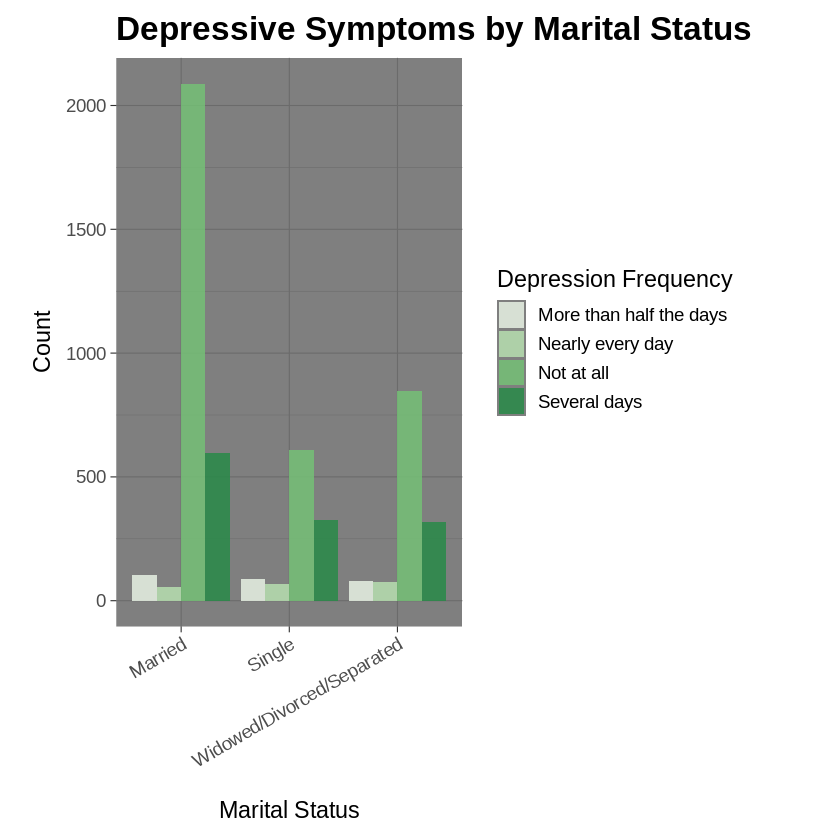

In [59]:
ggplot(filtered, aes(x = MaritalStatus, fill = DepressionLevel)) +
  geom_bar(position = "dodge", alpha = 0.8) +
  scale_fill_brewer(palette = "Dark") +
  labs(
    title = "Depressive Symptoms by Marital Status",
    x = "Marital Status",
    y = "Count",
    fill = "Depression Frequency"
  ) +
  theme_dark(base_size = 14) +
  theme(
    axis.text.x = element_text(angle = 30, hjust = 1),
    plot.margin = margin(10, 20, 10, 20),
    plot.title = element_text(size = 20, face = "bold")
  )
